<center>

# Diplomatura en Ciencia de Datos, Aprendizaje Automático y sus Aplicaciones
    
## Práctico # 2. Análisis exploratorio y curación de datos


</center>

--------------

## Análisis y Predicción de Calidad del Aire en una Zona Urbana: Exploración de Datos Multisensor y Modelado Predictivo

<span style="font-family: Arial, sans-serif; font-size: 16px;">
    
La calidad del aire es un tema importante en la agenda mundial de salud ambiental. Según la OMS (2018), los contaminantes atmosféricos son responsables de 1 de cada 9 muertes. Sin embargo, muchas partes del mundo carecen de datos básicos sobre la calidad del aire.
    
Este conjunto de datos contiene respuestas de un dispositivo multisensor de gases instalado en una zona significativamente contaminada en Italia. El objetivo es examinar cómo los factores ambientales y la concentración de contaminantes interactúan entre sí. Lo que permitirá comprender el nivel de contaminación del área urbana y utilizar la ciencia de datos para informar estrategias de salud ambiental y recomendaciones prácticas para mejorar la calidad del aire y proteger la salud de las personas que viven allí.  

Los datos fueron tomados de https://archive.ics.uci.edu/dataset/360/air+quality
    
</span>

## Objetivo del práctico

<span style="font-family: Arial, sans-serif; font-size: 16px;">

En el análisis exploratorio y curación de datos, vamos a realizar la limpieza de los datos y hacer un exploratorio para identificar la información relevante proporcionada por el dataset.
    
Observaremos detenidamente las variables definitivas con las que trabajaremos y la forma en cómo abordaremos los datos faltantes utilizando técnicas de imputación o eliminación según corresponda, para preservar la integridad de nuestro análisis y encontrar posibles relaciones entre las variables.
    
Este práctico es importante porque nos facilitará la selección del modelo más adecuado que aborde las preguntas y problemas del proyecto.

</span>

<span style="font-family: Arial, sans-serif; font-size: 16px;">
    
### Dataset:
    
Consta de 9471 filas y 17 columnas, registrando promedios horarios de respuestas y concentraciones de gases, obtenidas por un analizador certificado mediante sensores químicos de óxido de metal (identificados como PT08.S1, S2, S3, S4 y S5), abarcando un periodo de 1 año a partir del mes de marzo de 2004 y abril de 2005. Los datos faltantes se han codificado como -200.

**Variables a analizar**
    
1. **Fecha** (DD/MM/AAAA)
    
2. **Hora** (HH.MM.SS)
    
3. **CO (GT)(Monoxido de Carbono)**: concentración promedio horaria real de CO en mg/m3 (analizador de referencia)
    
4. **PT08.S1 (óxido de estaño)**: respuesta promedio horaria del sensor (nominalmente objetivo de CO)
    
5. **NMHC (GT)**: concentración total promedio horaria real de hidrocarburos no metánicos en microg/m3 (analizador de referencia)
    
6. **C6H6(GT)(Benceno)**: concentración de benceno promediada por hora real en microg/m3 (analizador de referencia)
    
7. **PT08.S2 (titania)**: respuesta promedio horaria del sensor (nominalmente dirigida a NMHC)
    
8. **NOx(GT)(Oxidos de Nitrogeno)**: concentración de NOx promediada por hora real en ppb (analizador de referencia)
    
9. **PT08.S3 (óxido de tungsteno)**: respuesta promedio horaria del sensor (nominalmente objetivo de NOx)
    
10. **NO2(GT)(Dioxidos de Nitrogeno)**: concentración de NO2 promediada por hora real en microg/m3 (analizador de referencia)
    
11. **PT08.S4 (óxido de tungsteno)**: respuesta promedio horaria del sensor (nominalmente objetivo de NO2)
    
12. **PT08.S5 (óxido de indio)**: respuesta promedio horaria del sensor (nominalmente objetivo de O3)
    
13. **T**: Temperatura en °C
    
14. **HR**: Humedad relativa (%)
    
15. **AH**: Humedad Absoluta
    
</span>

### Preguntas a responder en el práctico 2:

<span style="font-family: Arial, sans-serif; font-size: 16px;">

    1.¿Los sensores utilizados en el estudio, están específicamente asociados a la medición de un contaminante en particular?
    
    2. ¿Existe alguna relación entre las condiciones ambientales y la concentración de los contaminantes analizados?
    
    3. ¿Hay correlación significativa entre las concentraciones de CO, C6H6, NMHC, NOx y NO2, y las respuestas de los sensores de gas S1, S2, S3, S4 y S5?

</span>

### Antes de responder las preguntas anteriores, es necesario ponerse de acuerdo en los siguientes puntos para la limpieza de datos. Este proceso es determinante para continuar con el práctico # 3 donde aplicaremos modelos de Machine Learning:

<span style="font-family: Arial, sans-serif; font-size: 16px;">
    
    1. ¿Cómo abordaremos los datos faltantes? valor 0, media, mediana o moda.
    
    2. ¿Cómo abordaremos los outliers?
    
    3. ¿Qué variables elegiremos para realizar los próximos análisis? ¿en qué criterios nos basaremos?
    
    4. ¿Agregaremos columnas calculadas nuevas? Si decidimos crear columnas nuevas, ¿usaremos una combinación de variables o anexaremos datos nuevos? ¿De qué fuentes los podríamos obtener? - IPco, IPNox, IPNO2 ..., ICA, Incluir info de salud, flujo vehicular, ...
    
</span>

<span style="font-family: Arial, sans-serif; font-size: 16px;">
    
#### Si necesitas descargar el conjunto de datos, acceder al siguiente repositorio:

https://github.com/PatriMiranda/Calidad-de-Aire/blob/main/AirQualityUCI.csv

</span>

-----

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import scipy.stats as stats
import missingno as msno
from sklearn.impute import KNNImputer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler


##Pre-proceso

In [ ]:
# Cargar el dataset

df = pd.read_csv("https://raw.githubusercontent.com/PatriMiranda/Calidad-de-Aire/main/AirQualityUCI.csv", delimiter=',')
df.head()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
0,10/03/2004,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578,NaN,NaN
1,10/03/2004,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255,NaN,NaN
2,10/03/2004,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502,NaN,NaN
3,10/03/2004,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867,NaN,NaN
4,10/03/2004,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888,NaN,NaN


In [ ]:
df.tail()

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,Unnamed: 15,Unnamed: 16
9466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9470,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Eliminar colunas sin datos

df.drop(['Unnamed: 15','Unnamed: 16'], axis=1, inplace=True, errors = 'ignore')
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9466,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9467,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9468,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9469,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Eliminar las filas sin datos

df.dropna(how='all',inplace=True)
df

,Date,Time,CO(GT),PT08.S1(CO),NMHC(GT),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2.6,1360.0,150.0,11.9,1046.0,166.0,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2.0,1292.0,112.0,9.4,955.0,103.0,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2.2,1402.0,88.0,9.0,939.0,131.0,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2.2,1376.0,80.0,9.2,948.0,172.0,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1.6,1272.0,51.0,6.5,836.0,131.0,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,3.1,1314.0,-200.0,13.5,1101.0,472.0,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11:00:00,2.4,1163.0,-200.0,11.4,1027.0,353.0,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12:00:00,2.4,1142.0,-200.0,12.4,1063.0,293.0,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13:00:00,2.1,1003.0,-200.0,9.5,961.0,235.0,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


In [ ]:
# Verificar si aun quedan valores nulos

df.isnull().sum()

,0
Date,0
Time,0
CO(GT),0
PT08.S1(CO),0
NMHC(GT),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0


In [ ]:
#Contar los valores con -200 dentro del dataset

count_of_minus_200 = df.eq(-200).sum()
print(count_of_minus_200)

Date                0
Time                0
CO(GT)           1683
PT08.S1(CO)       366
NMHC(GT)         8443
C6H6(GT)          366
PT08.S2(NMHC)     366
NOx(GT)          1639
PT08.S3(NOx)      366
NO2(GT)          1642
PT08.S4(NO2)      366
PT08.S5(O3)       366
T                 366
RH                366
AH                366
dtype: int64


In [ ]:
porcentaje_minus_200 = (count_of_minus_200 / len(df)) * 100
print(porcentaje_minus_200)    # Eliminar las variables donde sea mayor al 50% de datos faltantes

Date              0.000000
Time              0.000000
CO(GT)           17.986534
PT08.S1(CO)       3.911510
NMHC(GT)         90.231912
C6H6(GT)          3.911510
PT08.S2(NMHC)     3.911510
NOx(GT)          17.516298
PT08.S3(NOx)      3.911510
NO2(GT)          17.548360
PT08.S4(NO2)      3.911510
PT08.S5(O3)       3.911510
T                 3.911510
RH                3.911510
AH                3.911510
dtype: float64


Retiremos la variable `'NMHC(GT)'` ya que la informacion presente es menos de 10%

In [ ]:
#eliminamos la columna con 90% de -200
df.drop(['NMHC(GT)'], axis=1, inplace=True, errors = 'ignore')
df.columns



Index(['Date', 'Time', 'CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
       'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
       'T', 'RH', 'AH'],
      dtype='object')

In [ ]:
df.replace(-200,np.nan,inplace=True)
df.isnull().sum()

,0
Date,0
Time,0
CO(GT),1683
PT08.S1(CO),366
C6H6(GT),366
PT08.S2(NMHC),366
NOx(GT),1639
PT08.S3(NOx),366
NO2(GT),1642
PT08.S4(NO2),366


#Comienzo de analisis

##Conversion de Unidades a $\mu g/m^3$

Notemos que las variables `NOx` y `CO` tiene unidades distintas al resto,  con las unidades `ppb` y `mg/m3` respectivamente las cuales tranformemos a `microg/m3`.

Para convertir la concentración de NOx (por ejemplo 166.0 ppb) a µg/m³, utilizaremos la fórmula general con el peso molecular promedio de NOx.

1. **Calcular el peso molecular promedio de NOx:**
   - Peso molecular de NO (óxido nítrico): 30 g/mol
   - Peso molecular de NO₂ (dióxido de nitrógeno): 46 g/mol
   - Peso molecular promedio (asumiendo proporciones iguales):
   $ M_{\text{NOx}} = \frac{30 + 46}{2} = 38 \, \text{g/mol} $

2. **Aplicar la fórmula de conversión:**
   $\text{Concentración} (\mu g/m^3) = \text{Concentración} (ppb) \times \frac{M_{\text{NOx}}}{24.45} $

   Dado que la concentración de NOx es 166.0 ppb:

   $\text{Concentración} (\mu g/m^3) = 166.0 \, \text{ppb} \times \frac{38 \, \text{g/mol}}{24.45}$

3. **Calcular la parte numérica:**
   
   $\text{Concentración} (\mu g/m^3) = 166.0 \times \frac{38}{24.45} $

   Realizamos el cálculo:

   $\text{Concentración} (\mu g/m^3) = 166.0 \times 1.554 = 257.964 \, \mu g/m^3 $

Por lo tanto, las concentraciones de NOx ppb las podemos convertir aproximadamente multiplicando por $38/24.45$ bajo condiciones estándar.

In [ ]:
df.loc[:,'NOx(GT)'] *= (38/24.45)
df

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2.6,1360.0,11.9,1046.0,257.995910,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2.0,1292.0,9.4,955.0,160.081800,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2.2,1402.0,9.0,939.0,203.599182,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2.2,1376.0,9.2,948.0,267.321063,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1.6,1272.0,6.5,836.0,203.599182,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,3.1,1314.0,13.5,1101.0,733.578732,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11:00:00,2.4,1163.0,11.4,1027.0,548.629857,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12:00:00,2.4,1142.0,12.4,1063.0,455.378323,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13:00:00,2.1,1003.0,9.5,961.0,365.235174,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


Para convertir la variable `CO` de $mg/m^3$ a $\mu g/m^3$ solo tenemos que multiplicar los valores por 1000

In [ ]:
df.loc[:,'CO(GT)'] *= 1000
df

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2600.0,1360.0,11.9,1046.0,257.995910,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2000.0,1292.0,9.4,955.0,160.081800,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2200.0,1402.0,9.0,939.0,203.599182,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2200.0,1376.0,9.2,948.0,267.321063,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1600.0,1272.0,6.5,836.0,203.599182,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,3100.0,1314.0,13.5,1101.0,733.578732,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11:00:00,2400.0,1163.0,11.4,1027.0,548.629857,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12:00:00,2400.0,1142.0,12.4,1063.0,455.378323,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13:00:00,2100.0,1003.0,9.5,961.0,365.235174,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


Ahora todos los contaminantes estan en las mismas unidades $(\mu g/m^3)$

##Analisis de los NaNs

Ahora si reemplazamos los -200 con NaNs

In [ ]:
df.replace(-200, np.nan, inplace=True)

Podemos recordar un par de graficos para ver la distribucion de valores nulos y no nulos

<Axes: >

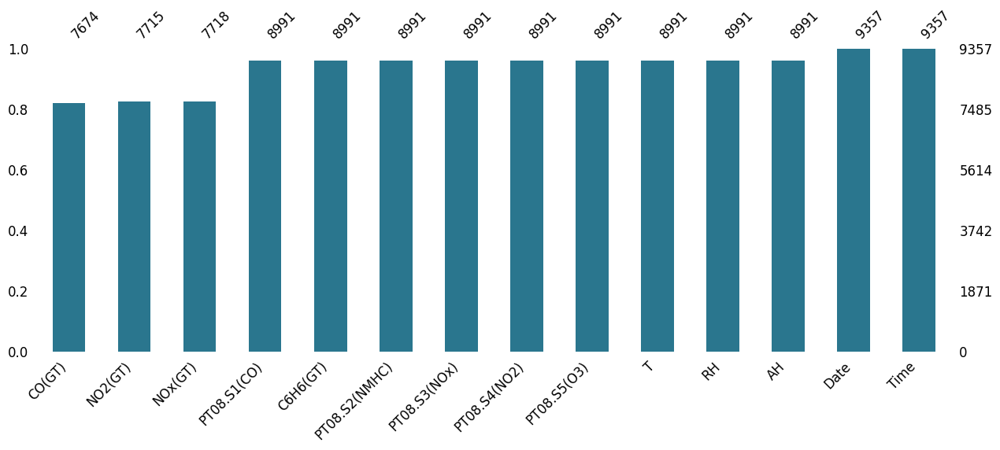

In [ ]:
# Definir la paleta 'viridis'
viridis_palette = sns.color_palette('viridis', 256)

# Seleccionar un color de la paleta 'viridis'
viridis_color = viridis_palette[100]  # Puedes cambiar el índice para seleccionar un color diferente

#Graficamos para ve los valores nulos
msno.bar(df,figsize=(15,5), sort="ascending",fontsize=12, color=viridis_color )

<Axes: >

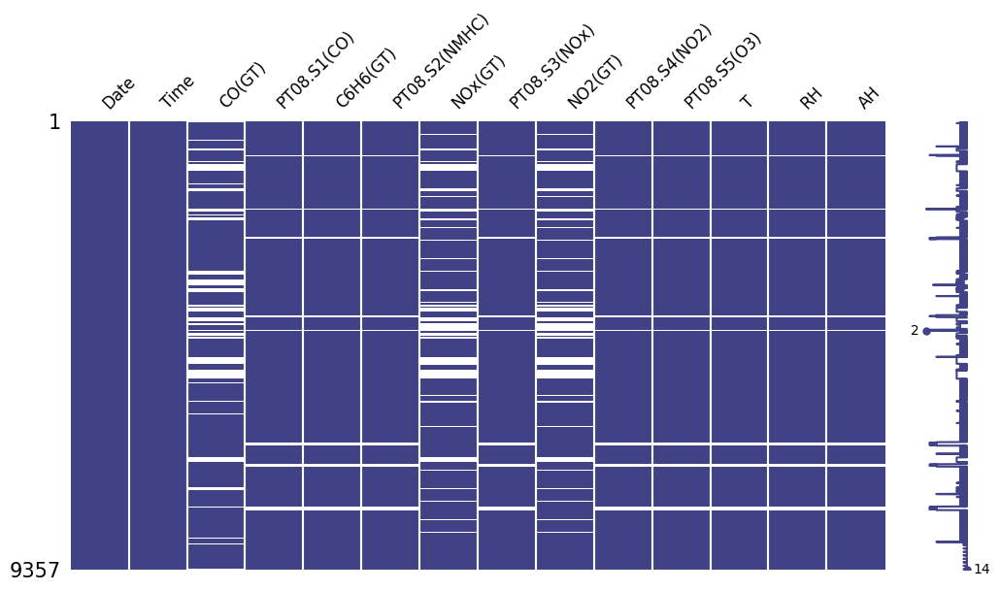

In [ ]:
# Definir la paleta 'viridis'
viridis_palette = sns.color_palette('viridis', 256)

# Seleccionar un color de la paleta 'viridis'
viridis_color = viridis_palette[50]  # Puedes cambiar el índice para seleccionar un color diferente

msno.matrix(df,figsize=(12, 6), fontsize=12, color=viridis_color)

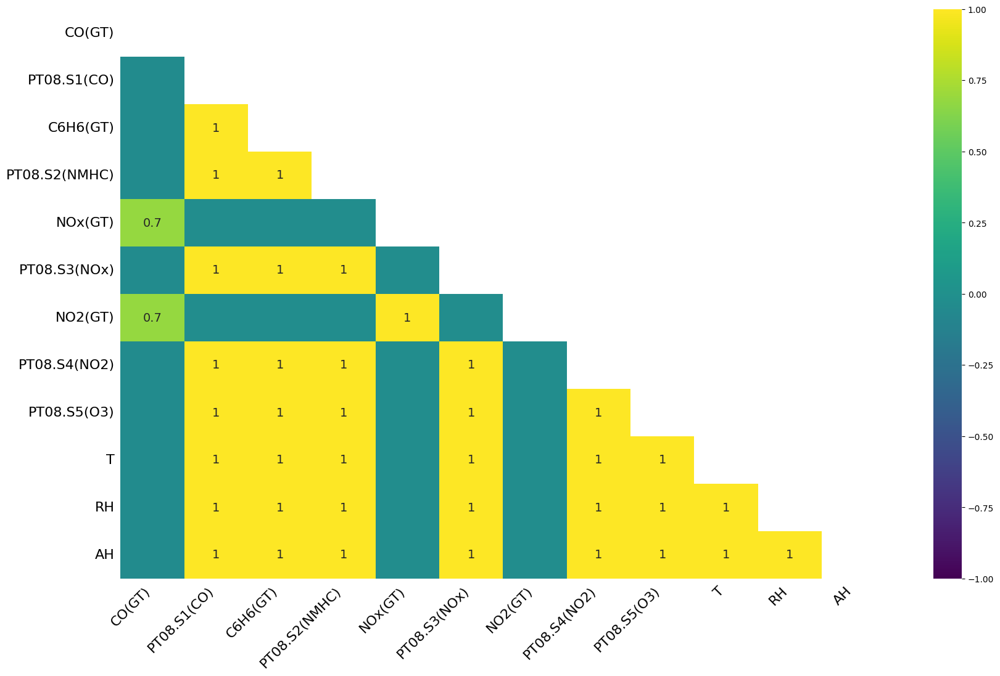

In [ ]:
# Definir la paleta 'viridis'
viridis_cmap = sns.color_palette('viridis', as_cmap=True)

# Graficar la matriz de calor de valores faltantes
msno.heatmap(df, cmap=viridis_cmap)

# Mostrar la gráfica
plt.show()

Un valor de 1 en el gráfico superior indica una perfecta correlación en los valores faltantes entre las variables, es decir, cuando una variable tiene un dato faltante, la otra también lo tiene, sin excepción.

Podemos ver que hay una relacion entre los valores faltantes de las variables `PT08.S1(CO), C6H6(GT), PT08.S2(NMHC), PT08.S3(NOx), PT08.S4(NO2), PT08.S5(O3),T, RH, AH`. Vemos cuanta cantidad es esta información faltante.



In [ ]:
df[df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)','PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)','T', 'RH', 'AH']].isna().any(axis=1)]

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
524,01/04/2004,14:00:00,1700.0,NaN,NaN,NaN,153.865031,NaN,72.0,NaN,NaN,NaN,NaN,NaN
525,01/04/2004,15:00:00,1900.0,NaN,NaN,NaN,167.852761,NaN,81.0,NaN,NaN,NaN,NaN,NaN
526,01/04/2004,16:00:00,2300.0,NaN,NaN,NaN,203.599182,NaN,93.0,NaN,NaN,NaN,NaN,NaN
701,08/04/2004,23:00:00,2000.0,NaN,NaN,NaN,200.490798,NaN,106.0,NaN,NaN,NaN,NaN,NaN
702,09/04/2004,00:00:00,2400.0,NaN,NaN,NaN,239.345603,NaN,109.0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8111,11/02/2005,17:00:00,6600.0,NaN,NaN,NaN,1906.993865,NaN,326.0,NaN,NaN,NaN,NaN,NaN
8112,11/02/2005,18:00:00,6500.0,NaN,NaN,NaN,1648.997955,NaN,284.0,NaN,NaN,NaN,NaN,NaN
8113,11/02/2005,19:00:00,7100.0,NaN,NaN,NaN,1670.756646,NaN,289.0,NaN,NaN,NaN,NaN,NaN
8114,11/02/2005,20:00:00,4900.0,NaN,NaN,NaN,996.237219,NaN,215.0,NaN,NaN,NaN,NaN,NaN


In [ ]:
df[df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)','PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)','T', 'RH', 'AH']].isna().any(axis=1)].describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
count,330.000000,0.0,0.0,0.0,322.000000,0.0,322.000000,0.0,0.0,0.0,0.0,0.0
mean,2665.454545,NaN,NaN,NaN,551.772028,NaN,134.813665,NaN,NaN,NaN,NaN,NaN
std,1710.299732,NaN,NaN,NaN,485.704365,NaN,59.085049,NaN,NaN,NaN,NaN,NaN
min,300.000000,NaN,NaN,NaN,32.638037,NaN,35.000000,NaN,NaN,NaN,NaN,NaN
25%,1500.000000,NaN,NaN,NaN,170.184049,NaN,89.000000,NaN,NaN,NaN,NaN,NaN
50%,2200.000000,NaN,NaN,NaN,378.445808,NaN,122.500000,NaN,NaN,NaN,NaN,NaN
75%,3500.000000,NaN,NaN,NaN,789.918200,NaN,169.000000,NaN,NaN,NaN,NaN,NaN
max,9300.000000,NaN,NaN,NaN,2035.991820,NaN,340.000000,NaN,NaN,NaN,NaN,NaN


In [ ]:
len(df[df[['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)','PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)','T', 'RH', 'AH']].isna().any(axis=1)])/len(df)*100

3.9115100993908305

Es decir que esto representa un 3.9% del total del dataset.

Planteo del problema:

Si realizamos una imputacion, donde se imputen estos valores, se obtendra un 3.9% del dataset original donde solo se tenian 5 variables del total de 11. Es decir estos registros fueron mayormente imputados que los demas.

Veamos como quedaria el analisis imputando estos valores y como eliminando estos valores del dataset.

In [ ]:
df_cleaned_msno = df.copy()
df_cleaned_msno = df_cleaned_msno.dropna(subset=['PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)','PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)','T', 'RH', 'AH'])
df_cleaned_msno

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2600.0,1360.0,11.9,1046.0,257.995910,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2000.0,1292.0,9.4,955.0,160.081800,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2200.0,1402.0,9.0,939.0,203.599182,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2200.0,1376.0,9.2,948.0,267.321063,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1600.0,1272.0,6.5,836.0,203.599182,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,3100.0,1314.0,13.5,1101.0,733.578732,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11:00:00,2400.0,1163.0,11.4,1027.0,548.629857,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12:00:00,2400.0,1142.0,12.4,1063.0,455.378323,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13:00:00,2100.0,1003.0,9.5,961.0,365.235174,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


<Axes: >

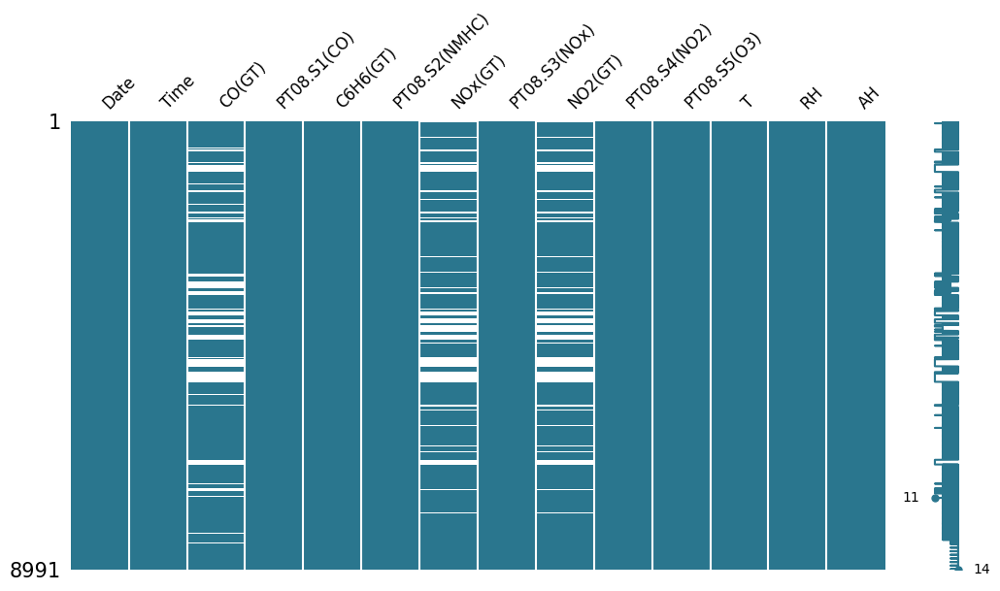

In [ ]:
# Definir la paleta 'viridis'
viridis_palette = sns.color_palette('viridis', 256)

# Seleccionar un color de la paleta 'viridis'
viridis_color = viridis_palette[100]  # Puedes cambiar el índice para seleccionar un color diferente

msno.matrix(df_cleaned_msno,figsize=(12, 6), fontsize=12, color=viridis_color)


In [ ]:
df_cleaned_msno[df_cleaned_msno[['CO(GT)','NO2(GT)']].isna().any(axis=1)]

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
9,11/03/2004,03:00:00,600.0,1010.0,1.7,561.0,NaN,1705.0,NaN,1235.0,501.0,10.3,60.2,0.7517
10,11/03/2004,04:00:00,NaN,1011.0,1.3,527.0,32.638037,1818.0,34.0,1197.0,445.0,10.1,60.5,0.7465
33,12/03/2004,03:00:00,800.0,889.0,1.9,574.0,NaN,1680.0,NaN,1187.0,512.0,7.0,62.3,0.6261
34,12/03/2004,04:00:00,NaN,831.0,1.1,506.0,32.638037,1893.0,32.0,1134.0,384.0,6.1,65.9,0.6248
39,12/03/2004,09:00:00,NaN,1545.0,22.1,1353.0,NaN,767.0,NaN,2058.0,1588.0,9.2,56.2,0.6561
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9058,23/03/2005,04:00:00,NaN,993.0,2.3,604.0,132.106339,848.0,65.0,1160.0,762.0,14.5,66.4,1.0919
9130,26/03/2005,04:00:00,NaN,1122.0,6.0,811.0,281.308793,641.0,92.0,1336.0,1122.0,16.2,71.2,1.3013
9202,29/03/2005,04:00:00,NaN,883.0,1.3,530.0,97.914110,997.0,46.0,1102.0,617.0,13.7,68.2,1.0611
9274,01/04/2005,04:00:00,NaN,818.0,0.8,473.0,73.047035,1257.0,41.0,898.0,323.0,13.7,48.8,0.7606


In [ ]:
len(df_cleaned_msno[df_cleaned_msno[['CO(GT)','NO2(GT)']].isna().any(axis=1)])/len(df)*100

21.908731431014214

Pocentaje de los valores a imputar en este caso.

*Baseline de distribuciones de las variables.*

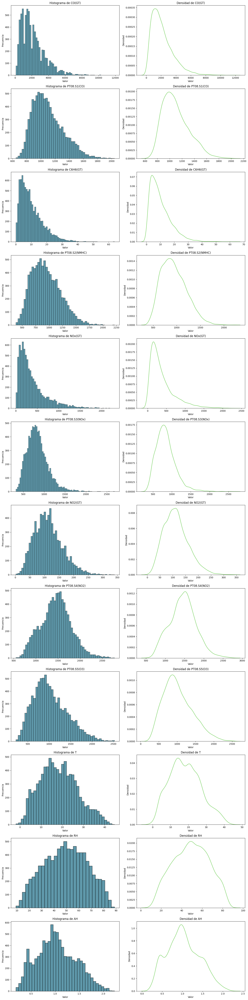

In [ ]:
# Lista de columnas de contaminantes
columns = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
           'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
           'T', 'RH', 'AH']

# Crear una figura y ejes para cada columna (contaminante)
num_columns = len(columns)
fig, axs = plt.subplots(num_columns, 2, figsize=(15, 5 * num_columns))

# Asegurarse de que axs sea siempre una lista de ejes, incluso si es solo uno
if num_columns == 1:
    axs = [axs]
# Definir la paleta 'viridis'
viridis_palette = sns.color_palette('viridis', 256)

# Seleccionar dos colores de la paleta 'viridis'
color_hist = viridis_palette[100]  # Un color para el histograma
color_kde = viridis_palette[200]  # Otro color para el gráfico de densidad

# Iterar sobre cada columna de contaminante
for i, column in enumerate(columns):
    # Crear histograma
    sns.histplot(df[column], kde=False, ax=axs[i, 0], color=color_hist) #Kde desactiva la estimacion de densidad del histograma
    axs[i, 0].set_title(f'Histograma de {column}')
    axs[i, 0].set_xlabel('Valor')
    axs[i, 0].set_ylabel('Frecuencia')

    # Crear gráfico de densidad
    sns.kdeplot(df[column], ax=axs[i, 1], color=color_kde)
    axs[i, 1].set_title(f'Densidad de {column}')
    axs[i, 1].set_xlabel('Valor')
    axs[i, 1].set_ylabel('Densidad')

plt.tight_layout()
plt.show()

Notar que estos graficos no tienen en cuenta los valores NaNs

##Analisis Sin NaNs

Tomemos como base el analisis el dataframe anterior, donde los graficos no tiene en cuenta a los valores NaNs, por lo tanto dejemos un dataset sin estos valores como una posible opcion como dataset limpio.

Luego comparemos todo este analisis con diferentes imputaciones.

In [ ]:
df_sin_nan = df.copy()
df_sin_nan = df_sin_nan.dropna()
df_sin_nan

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2600.0,1360.0,11.9,1046.0,257.995910,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2000.0,1292.0,9.4,955.0,160.081800,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2200.0,1402.0,9.0,939.0,203.599182,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2200.0,1376.0,9.2,948.0,267.321063,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1600.0,1272.0,6.5,836.0,203.599182,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,3100.0,1314.0,13.5,1101.0,733.578732,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11:00:00,2400.0,1163.0,11.4,1027.0,548.629857,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12:00:00,2400.0,1142.0,12.4,1063.0,455.378323,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13:00:00,2100.0,1003.0,9.5,961.0,365.235174,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


## Imputaciones

###Imputar por la media

In [ ]:
from sklearn.impute import SimpleImputer

# setting strategy to 'mean'
mean_imputer = SimpleImputer(missing_values=np.nan, strategy='mean')

# Make a copy if you want to keep the original dataset
df_mean_imputer = df.copy()

# Apply the imputer to the entire DataFrame and update it with the imputed values
df_mean_imputer.iloc[:, 2:] = mean_imputer.fit_transform(df_mean_imputer.iloc[:, 2:])
df_mean_imputer

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,2600.0,1360.0,11.9,1046.0,257.995910,1056.0,113.0,1692.0,1268.0,13.6,48.9,0.7578
1,10/03/2004,19:00:00,2000.0,1292.0,9.4,955.0,160.081800,1174.0,92.0,1559.0,972.0,13.3,47.7,0.7255
2,10/03/2004,20:00:00,2200.0,1402.0,9.0,939.0,203.599182,1140.0,114.0,1555.0,1074.0,11.9,54.0,0.7502
3,10/03/2004,21:00:00,2200.0,1376.0,9.2,948.0,267.321063,1092.0,122.0,1584.0,1203.0,11.0,60.0,0.7867
4,10/03/2004,22:00:00,1600.0,1272.0,6.5,836.0,203.599182,1205.0,116.0,1490.0,1110.0,11.2,59.6,0.7888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,3100.0,1314.0,13.5,1101.0,733.578732,539.0,190.0,1374.0,1729.0,21.9,29.3,0.7568
9353,04/04/2005,11:00:00,2400.0,1163.0,11.4,1027.0,548.629857,604.0,179.0,1264.0,1269.0,24.3,23.7,0.7119
9354,04/04/2005,12:00:00,2400.0,1142.0,12.4,1063.0,455.378323,603.0,175.0,1241.0,1092.0,26.9,18.3,0.6406
9355,04/04/2005,13:00:00,2100.0,1003.0,9.5,961.0,365.235174,702.0,156.0,1041.0,770.0,28.3,13.5,0.5139


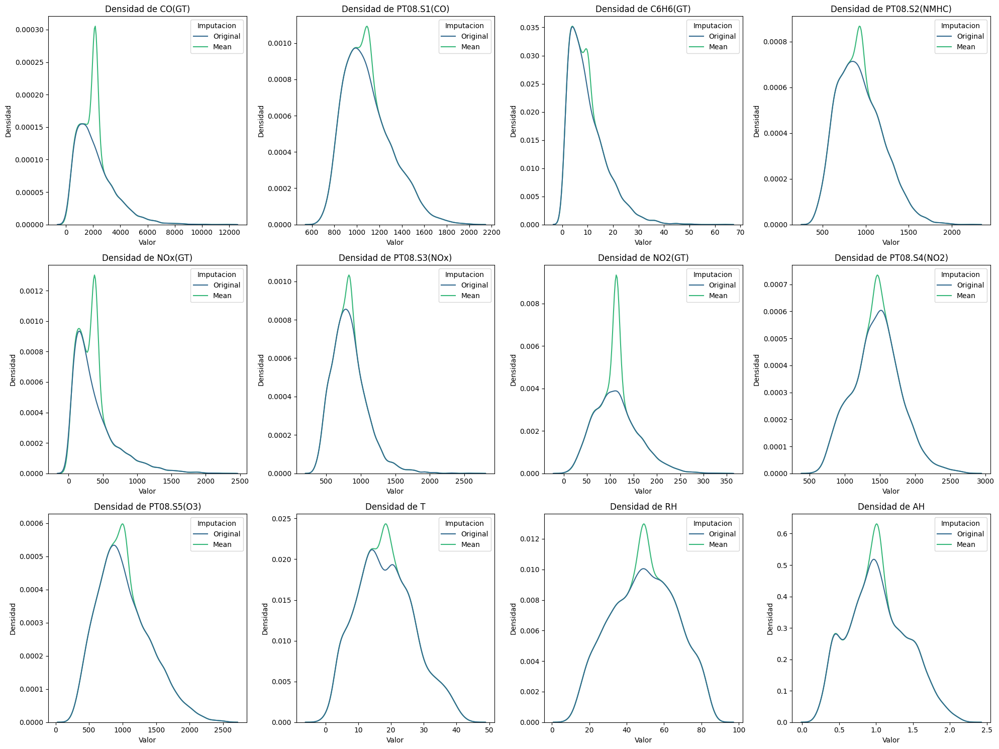

In [ ]:
# Lista de columnas de contaminantes y sensores
columns = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
           'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
           'T', 'RH', 'AH']

# Número de filas y columnas en la grilla
num_rows = 3
num_cols = 4

# Crear una figura y una grilla de ejes
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Aplanar la grilla de ejes para iterar fácilmente
axs = axs.flatten()

# Iterar sobre cada columna de contaminante
for i, column in enumerate(columns):
    # Crear dataset a comparar
    original = df[column].dropna().to_frame()
    original['Imputacion'] = 'Original'

    mean = df_mean_imputer[column].to_frame()
    mean['Imputacion'] = 'Mean'

    data = pd.concat([original, mean])

    # Crear gráfico de densidad
    sns.kdeplot(data=data, x=column, hue='Imputacion', ax=axs[i], palette="viridis")
    axs[i].set_title(f'Densidad de {column}')
    axs[i].set_xlabel('Valor')
    axs[i].set_ylabel('Densidad')

# Eliminar los ejes restantes si hay menos gráficos que espacios en la grilla
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

Observamos que las imputaciones por la media generan picos en las distribuciones , donde se presenta el valor de la media. Y en algunos casos los genera donde no habia un concavidad pre-existente.

### Imputacion por KNN

Primero preparemos la informacion para usar los regresores. Luego compararemos la informacion usando los datos Escalados vs Estandarizados, y los diferentes medotos de imputacion.

Ademas relicemos dos analisis, imputando tods los datos faltantes y otro con el dataset sin los datos descartados en el analisis de `missingno`

#### Imputando Todos los Datos Faltantes

**Escalar**

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Datos originales
data = df.copy()

# Crear un objeto MinMaxScaler
scaler = MinMaxScaler()

# Ajustar y transformar los datos
data_scaled = scaler.fit_transform(data.iloc[:,2:])
data_scaled = pd.DataFrame(data_scaled,columns=columns)
# Insertar las columnas sin escalar al principio
data_total_scaled = data_scaled.copy()
data_total_scaled.insert(0, 'Date', data['Date'])
data_total_scaled.insert(1, 'Time', data['Time'])

data_total_scaled

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.328402,0.513040,0.454822,0.333333,0.499371,0.280066
1,10/03/2004,19:00:00,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.266272,0.453237,0.326238,0.326882,0.484277,0.264282
2,10/03/2004,20:00:00,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.331361,0.451439,0.370547,0.296774,0.563522,0.276352
3,10/03/2004,21:00:00,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.355030,0.464478,0.426586,0.277419,0.638994,0.294190
4,10/03/2004,22:00:00,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.337278,0.422212,0.386186,0.281720,0.633962,0.295216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9352,04/04/2005,10:00:00,0.254237,0.478823,0.210692,0.392135,0.318213,0.091910,0.556213,0.370054,0.655083,0.511828,0.252830,0.279578
9353,04/04/2005,11:00:00,0.194915,0.370424,0.177673,0.351720,0.237644,0.119441,0.523669,0.320594,0.455256,0.563441,0.182390,0.257636
9354,04/04/2005,12:00:00,0.194915,0.355348,0.193396,0.371382,0.197021,0.119017,0.511834,0.310252,0.378367,0.619355,0.114465,0.222792
9355,04/04/2005,13:00:00,0.169492,0.255564,0.147799,0.315674,0.157752,0.160949,0.455621,0.220324,0.238488,0.649462,0.054088,0.160876


In [ ]:
data_total_scaled.isnull().sum()

,0
Date,0
Time,0
CO(GT),1683
PT08.S1(CO),366
C6H6(GT),366
PT08.S2(NMHC),366
NOx(GT),1639
PT08.S3(NOx),366
NO2(GT),1642
PT08.S4(NO2),366


Estandarizar

In [ ]:
from sklearn.preprocessing import StandardScaler

# Datos originales
data = df.copy()

# Crear un objeto StandardScaler
scaler = StandardScaler()

# Ajustar y transformar los datos
data_standard = scaler.fit_transform(data.iloc[:, 2:])
data_standard = pd.DataFrame(data_scaled, columns=data.columns[2:])

# Insertar las columnas sin escalar al principio
data_total_standard = data_scaled.copy()
data_total_standard.insert(0, 'Date', data['Date'])
data_total_standard.insert(1, 'Time', data['Time'])

data_total_standard


,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.335347,0.513040,0.454822,0.333333,0.499371,0.280066
1,10/03/2004,19:00:00,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.271903,0.453237,0.326238,0.326882,0.484277,0.264282
2,10/03/2004,20:00:00,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.338369,0.451439,0.370547,0.296774,0.563522,0.276352
3,10/03/2004,21:00:00,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.362538,0.464478,0.426586,0.277419,0.638994,0.294190
4,10/03/2004,22:00:00,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.344411,0.422212,0.386186,0.281720,0.633962,0.295216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8986,20/03/2005,04:00:00,0.254237,0.478823,0.210692,0.392135,0.318213,0.091910,0.567976,0.370054,0.655083,0.511828,0.252830,0.279578
8987,20/03/2005,05:00:00,0.194915,0.370424,0.177673,0.351720,0.237644,0.119441,0.534743,0.320594,0.455256,0.563441,0.182390,0.257636
8988,20/03/2005,06:00:00,0.194915,0.355348,0.193396,0.371382,0.197021,0.119017,0.522659,0.310252,0.378367,0.619355,0.114465,0.222792
8989,20/03/2005,07:00:00,0.169492,0.255564,0.147799,0.315674,0.157752,0.160949,0.465257,0.220324,0.238488,0.649462,0.054088,0.160876


In [ ]:
data_total_standard.isnull().sum()

,0
Date,0
Time,0
CO(GT),1647
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),1595
PT08.S3(NOx),0
NO2(GT),1598
PT08.S4(NO2),0


In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.linear_model import BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.impute import IterativeImputer


Metodos : `BayesianRidge, DecisionTreeRegressor,  KNeighborsRegressor`

Intente tambien el metodo `ExtraTreesRegressor` pero tardo mas tiempo que los demas, revisar luego.

In [ ]:
def Imputacion(data,algorithm):
  data_mice = data.copy(deep=True)
  #data_mice = data_mice.select_dtypes(include='number')
  mice_imputer = IterativeImputer(random_state=0, estimator=algorithm())

  data_mice.iloc[:, 2:] = mice_imputer.fit_transform(data_mice.iloc[:, 2:])

  return data_mice

Hacemos diferentes imputaciones con los diferentes metodos, para ambos casos, el estandarizado y el escalado.

Escalado

In [ ]:
df_bayesian_scaled_imputer = Imputacion(data_total_scaled,BayesianRidge)

df_tree_scaled_imputer = Imputacion(data_total_scaled,DecisionTreeRegressor)

df_knn_scaled_imputer = Imputacion(data_total_scaled,KNeighborsRegressor)

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [ ]:
df_bayesian_scaled_imputer.isnull().sum()

,0
Date,366
Time,366
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0


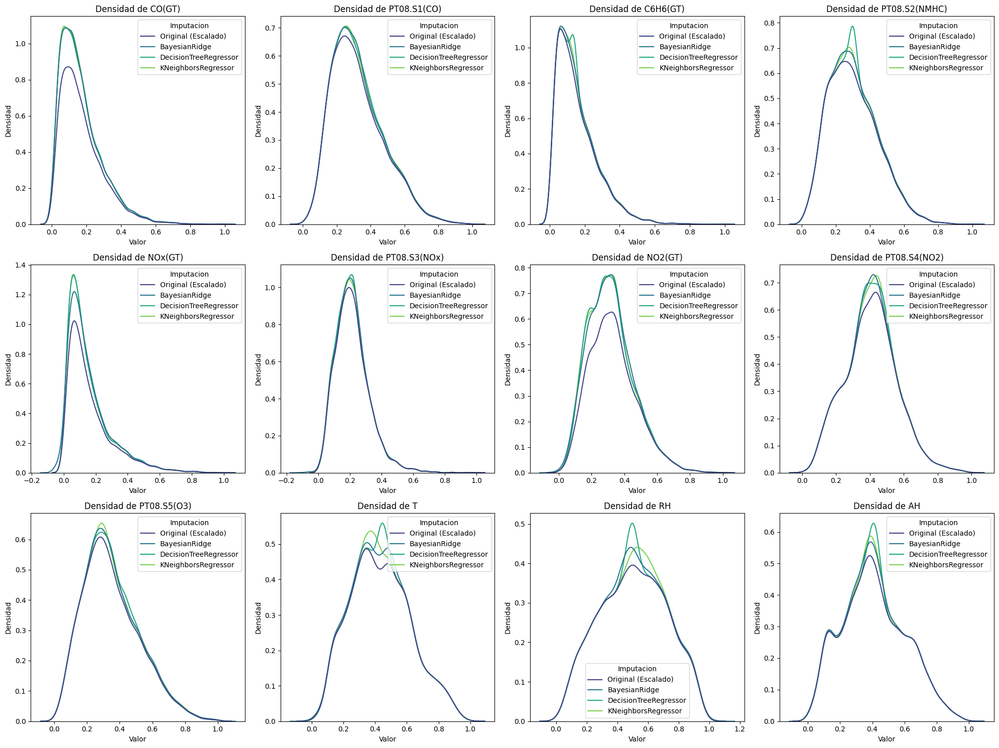

In [ ]:
# Lista de columnas de contaminantes
columns = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
           'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
           'T', 'RH', 'AH']

# Número de filas y columnas en la grilla
num_rows = 3
num_cols = 4

# Crear una figura y una grilla de ejes
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Aplanar la grilla de ejes para iterar fácilmente
axs = axs.flatten()

# Iterar sobre cada columna de contaminante
for i, column in enumerate(columns):
    # Crear dataset a comparar
    original = data_total_scaled[column].dropna().to_frame()
    original['Imputacion'] = 'Original (Escalado)'

    bayesian = df_bayesian_scaled_imputer[column].to_frame()
    bayesian['Imputacion'] = 'BayesianRidge'

    tree = df_tree_scaled_imputer[column].to_frame()
    tree['Imputacion'] = 'DecisionTreeRegressor'

    knn = df_knn_scaled_imputer[column].to_frame()
    knn['Imputacion'] = 'KNeighborsRegressor'

    data = pd.concat([original, bayesian, tree, knn]).reset_index(drop=True)

    # Crear gráfico de densidad
    sns.kdeplot(data=data, x=column, hue='Imputacion', ax=axs[i], palette='viridis')
    axs[i].set_title(f'Densidad de {column}')
    axs[i].set_xlabel('Valor')
    axs[i].set_ylabel('Densidad')

# Eliminar los ejes restantes si hay menos gráficos que espacios en la grilla
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

En este caso, `Todos los Datos Faltantes Imputados, escalandolos`  Los metodos que tiene un desempeño similar son `BayesianRidge`y `KNeighborsRegressor`

**Estandarizado**

In [ ]:
df_bayesian_standard_imputer = Imputacion(data_total_standard,BayesianRidge)

df_tree_standard_imputer = Imputacion(data_total_standard,DecisionTreeRegressor)

df_knn_standard_imputer = Imputacion(data_total_standard,KNeighborsRegressor)

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [ ]:
df_knn_standard_imputer.isnull().sum()

,0
Date,366
Time,366
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0


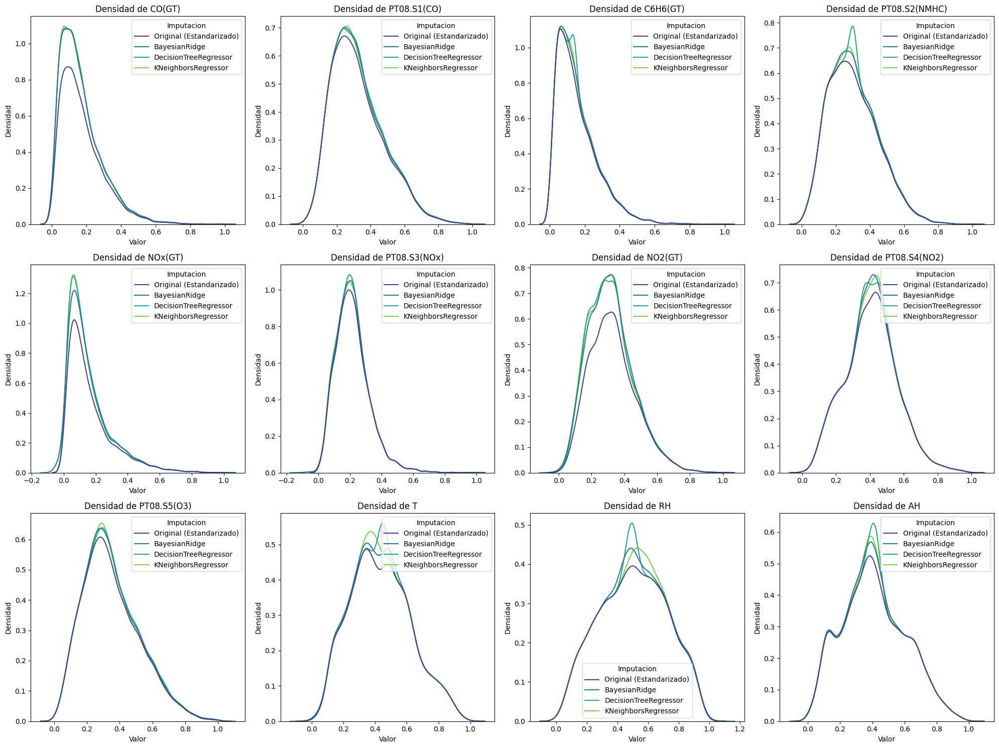

In [ ]:
# Lista de columnas de contaminantes
columns = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
           'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
           'T', 'RH', 'AH']

# Número de filas y columnas en la grilla
num_rows = 3
num_cols = 4

# Crear una figura y una grilla de ejes
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Aplanar la grilla de ejes para iterar fácilmente
axs = axs.flatten()

# Iterar sobre cada columna de contaminante
for i, column in enumerate(columns):
    # Crear dataset a comparar
    original = data_total_standard[column].dropna().to_frame()
    original['Imputacion'] = 'Original (Estandarizado)'

    bayesian = df_bayesian_standard_imputer[column].to_frame()
    bayesian['Imputacion'] = 'BayesianRidge'

    tree = df_tree_standard_imputer[column].to_frame()
    tree['Imputacion'] = 'DecisionTreeRegressor'

    knn = df_knn_standard_imputer[column].to_frame()
    knn['Imputacion'] = 'KNeighborsRegressor'

    data = pd.concat([original, bayesian, tree, knn]).reset_index(drop=True)

    # Crear gráfico de densidad
    sns.kdeplot(data=data, x=column, hue='Imputacion', ax=axs[i], palette='viridis')
    axs[i].set_title(f'Densidad de {column}')
    axs[i].set_xlabel('Valor')
    axs[i].set_ylabel('Densidad')

# Eliminar los ejes restantes si hay menos gráficos que espacios en la grilla
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()



---



#### Imputando los Datos sin el 3.9% de los Datos

**Preparacion previa**

In [ ]:
# Datos originales
data = df_cleaned_msno.copy()

# Crear un objeto MinMaxScaler
scaler = MinMaxScaler()

# Ajustar y transformar los datos
data_scaled = scaler.fit_transform(data.iloc[:,2:])
data_scaled = pd.DataFrame(data_scaled,columns=columns)
# Insertar las columnas sin escalar al principio
data_total_scaled_msno = data_scaled.copy()
data_total_scaled_msno.insert(0, 'Date', data['Date'])
data_total_scaled_msno.insert(1, 'Time', data['Time'])

data_total_scaled_msno

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.335347,0.513040,0.454822,0.333333,0.499371,0.280066
1,10/03/2004,19:00:00,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.271903,0.453237,0.326238,0.326882,0.484277,0.264282
2,10/03/2004,20:00:00,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.338369,0.451439,0.370547,0.296774,0.563522,0.276352
3,10/03/2004,21:00:00,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.362538,0.464478,0.426586,0.277419,0.638994,0.294190
4,10/03/2004,22:00:00,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.344411,0.422212,0.386186,0.281720,0.633962,0.295216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8986,20/03/2005,04:00:00,0.254237,0.478823,0.210692,0.392135,0.318213,0.091910,0.567976,0.370054,0.655083,0.511828,0.252830,0.279578
8987,20/03/2005,05:00:00,0.194915,0.370424,0.177673,0.351720,0.237644,0.119441,0.534743,0.320594,0.455256,0.563441,0.182390,0.257636
8988,20/03/2005,06:00:00,0.194915,0.355348,0.193396,0.371382,0.197021,0.119017,0.522659,0.310252,0.378367,0.619355,0.114465,0.222792
8989,20/03/2005,07:00:00,0.169492,0.255564,0.147799,0.315674,0.157752,0.160949,0.465257,0.220324,0.238488,0.649462,0.054088,0.160876


In [ ]:
# Datos originales
data = df_cleaned_msno.copy()

# Crear un objeto StandardScaler
scaler = StandardScaler()

# Ajustar y transformar los datos
data_standard = scaler.fit_transform(data.iloc[:, 2:])
data_standard = pd.DataFrame(data_scaled, columns=data.columns[2:])

# Insertar las columnas sin escalar al principio
data_total_standard_msno = data_scaled.copy()
data_total_standard_msno.insert(0, 'Date', data['Date'])
data_total_standard_msno.insert(1, 'Time', data['Time'])

data_total_standard_msno


,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.335347,0.513040,0.454822,0.333333,0.499371,0.280066
1,10/03/2004,19:00:00,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.271903,0.453237,0.326238,0.326882,0.484277,0.264282
2,10/03/2004,20:00:00,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.338369,0.451439,0.370547,0.296774,0.563522,0.276352
3,10/03/2004,21:00:00,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.362538,0.464478,0.426586,0.277419,0.638994,0.294190
4,10/03/2004,22:00:00,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.344411,0.422212,0.386186,0.281720,0.633962,0.295216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8986,20/03/2005,04:00:00,0.254237,0.478823,0.210692,0.392135,0.318213,0.091910,0.567976,0.370054,0.655083,0.511828,0.252830,0.279578
8987,20/03/2005,05:00:00,0.194915,0.370424,0.177673,0.351720,0.237644,0.119441,0.534743,0.320594,0.455256,0.563441,0.182390,0.257636
8988,20/03/2005,06:00:00,0.194915,0.355348,0.193396,0.371382,0.197021,0.119017,0.522659,0.310252,0.378367,0.619355,0.114465,0.222792
8989,20/03/2005,07:00:00,0.169492,0.255564,0.147799,0.315674,0.157752,0.160949,0.465257,0.220324,0.238488,0.649462,0.054088,0.160876


In [ ]:
data_total_scaled_msno.isnull().sum()

,0
Date,366
Time,366
CO(GT),1647
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),1595
PT08.S3(NOx),0
NO2(GT),1598
PT08.S4(NO2),0


Hacemos diferentes imputaciones con los diferentes metodos, para ambos casos, el estandarizado y el escalado.

Escalado

In [ ]:
df_bayesian_scaled_imputer = Imputacion(data_total_scaled_msno,BayesianRidge)

df_tree_scaled_imputer = Imputacion(data_total_scaled_msno,DecisionTreeRegressor)

df_knn_scaled_imputer = Imputacion(data_total_scaled_msno,KNeighborsRegressor)

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [ ]:
df_knn_scaled_imputer.isnull().sum()

,0
Date,366
Time,366
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0


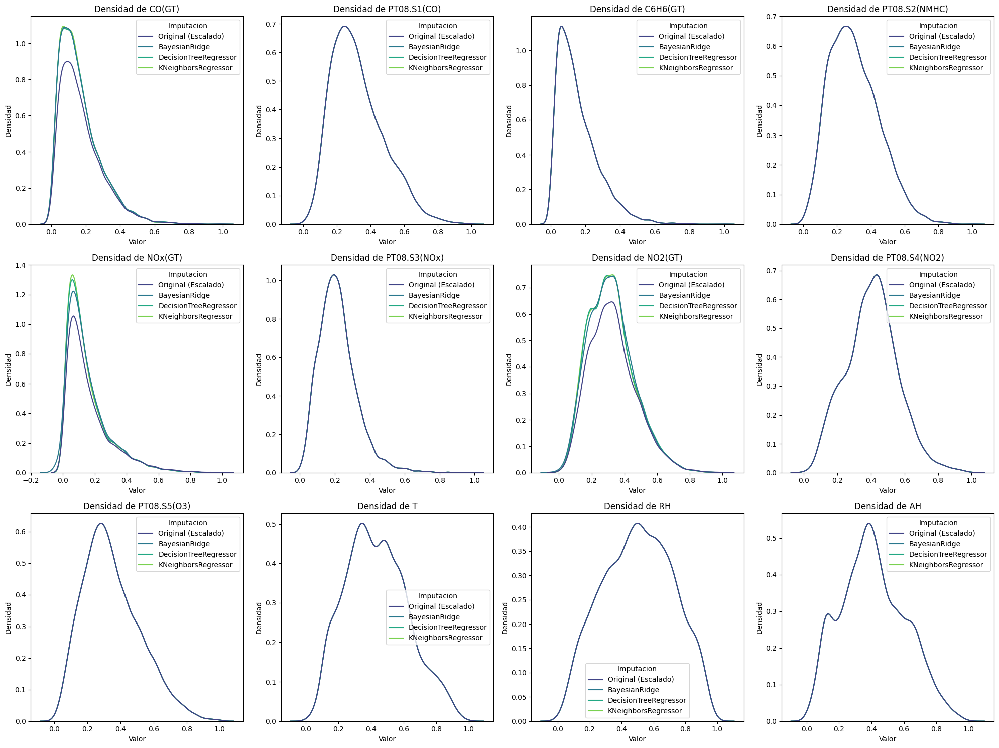

In [ ]:
# Lista de columnas de contaminantes
columns = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
           'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
           'T', 'RH', 'AH']

# Número de filas y columnas en la grilla
num_rows = 3
num_cols = 4

# Crear una figura y una grilla de ejes
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Aplanar la grilla de ejes para iterar fácilmente
axs = axs.flatten()

# Iterar sobre cada columna de contaminante
for i, column in enumerate(columns):
    # Crear dataset a comparar
    original = data_total_scaled[column].dropna().to_frame()
    original['Imputacion'] = 'Original (Escalado)'

    bayesian = df_bayesian_scaled_imputer[column].to_frame()
    bayesian['Imputacion'] = 'BayesianRidge'

    tree = df_tree_scaled_imputer[column].to_frame()
    tree['Imputacion'] = 'DecisionTreeRegressor'

    knn = df_knn_scaled_imputer[column].to_frame()
    knn['Imputacion'] = 'KNeighborsRegressor'

    data = pd.concat([original, bayesian, tree, knn]).reset_index(drop=True)

    # Crear gráfico de densidad
    sns.kdeplot(data=data, x=column, hue='Imputacion', ax=axs[i], palette='viridis')
    axs[i].set_title(f'Densidad de {column}')
    axs[i].set_xlabel('Valor')
    axs[i].set_ylabel('Densidad')

# Eliminar los ejes restantes si hay menos gráficos que espacios en la grilla
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

En este caso, `Imputando los datos sin el 3.9% , escalandolos` vemos ,como era de esperarse, solo imputamos 2 columnas `CO(GT)` y `NO2(GT)`, donde el metodo con mas estabilidad es el de `KNeighborsRegressor`

**Estandarizado**

In [ ]:
df_bayesian_standard_imputer = Imputacion(data_total_standard_msno,BayesianRidge)

df_tree_standard_imputer = Imputacion(data_total_standard_msno,DecisionTreeRegressor)

df_knn_standard_imputer = Imputacion(data_total_standard_msno,KNeighborsRegressor)

/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/impute/_iterative.py:800: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


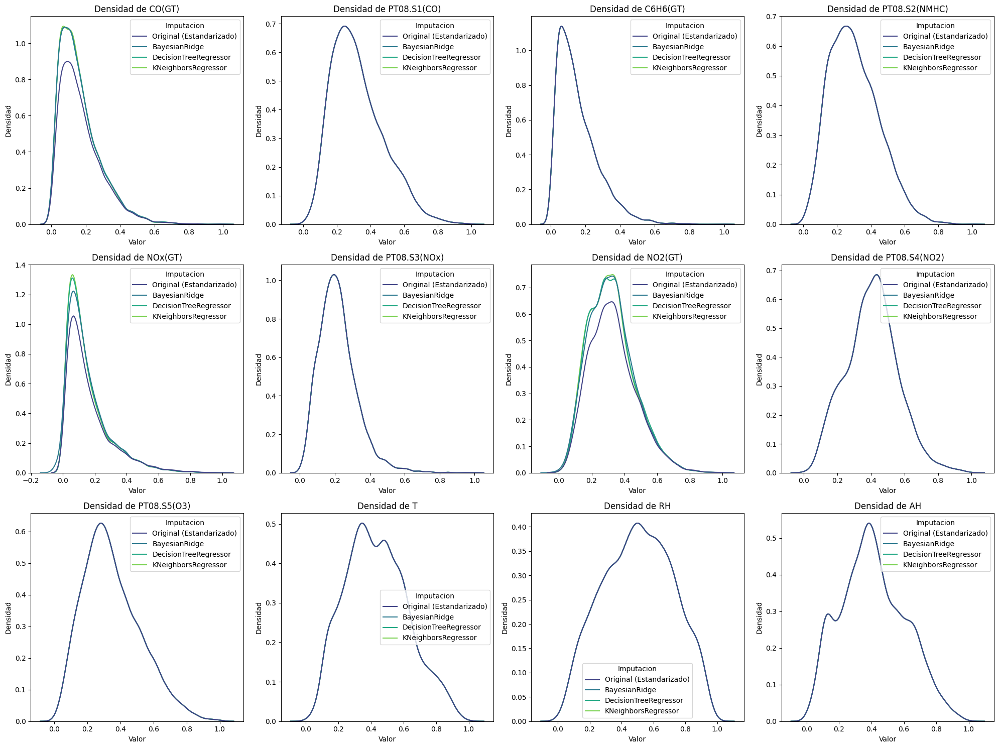

In [ ]:
# Lista de columnas de contaminantes
columns = ['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)',
           'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)',
           'T', 'RH', 'AH']

# Número de filas y columnas en la grilla
num_rows = 3
num_cols = 4

# Crear una figura y una grilla de ejes
fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 15))

# Aplanar la grilla de ejes para iterar fácilmente
axs = axs.flatten()

# Iterar sobre cada columna de contaminante
for i, column in enumerate(columns):
    # Crear dataset a comparar
    original = data_total_standard[column].dropna().to_frame()
    original['Imputacion'] = 'Original (Estandarizado)'

    bayesian = df_bayesian_standard_imputer[column].to_frame()
    bayesian['Imputacion'] = 'BayesianRidge'

    tree = df_tree_standard_imputer[column].to_frame()
    tree['Imputacion'] = 'DecisionTreeRegressor'

    knn = df_knn_standard_imputer[column].to_frame()
    knn['Imputacion'] = 'KNeighborsRegressor'

    data = pd.concat([original, bayesian, tree, knn]).reset_index(drop=True)

    # Crear gráfico de densidad
    sns.kdeplot(data=data, x=column, hue='Imputacion', ax=axs[i], palette='viridis')
    axs[i].set_title(f'Densidad de {column}')
    axs[i].set_xlabel('Valor')
    axs[i].set_ylabel('Densidad')

# Eliminar los ejes restantes si hay menos gráficos que espacios en la grilla
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

plt.tight_layout()
plt.show()

In [ ]:
df_knn_standard_imputer.isnull().sum()

,0
Date,366
Time,366
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0




---



En este caso tenemos un comportamiento muy similar que el anterior analisis, sin ninguna mejora considerativa.

###Seleccion de Imputacion

Considerando que las imputaciones de los datos especiales destacados en el analisis de missingo tienen una muy buena distribucion luego de ser imputados y siendo que estos datos faltantes pueden representar eventos especiales donde solo se tomo la medicion se contaminantes `CO(GT)`,`NOx(GT)`y`NO2(GT)`, elijamos la `imputacion completa de los datos, junto con el metodo de KKN escalando los datos por MinMaxScaler.`

In [ ]:
df_knn_scaled_imputer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8991 entries, 0 to 8990
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           8625 non-null   object        
 1   Time           8625 non-null   object        
 2   CO(GT)         8991 non-null   float64       
 3   PT08.S1(CO)    8991 non-null   float64       
 4   C6H6(GT)       8991 non-null   float64       
 5   PT08.S2(NMHC)  8991 non-null   float64       
 6   NOx(GT)        8991 non-null   float64       
 7   PT08.S3(NOx)   8991 non-null   float64       
 8   NO2(GT)        8991 non-null   float64       
 9   PT08.S4(NO2)   8991 non-null   float64       
 10  PT08.S5(O3)    8991 non-null   float64       
 11  T              8991 non-null   float64       
 12  RH             8991 non-null   float64       
 13  AH             8991 non-null   float64       
 14  DateTime       8625 non-null   datetime64[ns]
dtypes: datetime64[ns](1),

In [ ]:
df_imputado = df_knn_scaled_imputer
df_imputado

,Date,Time,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH
0,10/03/2004,18:00:00,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.335347,0.513040,0.454822,0.333333,0.499371,0.280066
1,10/03/2004,19:00:00,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.271903,0.453237,0.326238,0.326882,0.484277,0.264282
2,10/03/2004,20:00:00,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.338369,0.451439,0.370547,0.296774,0.563522,0.276352
3,10/03/2004,21:00:00,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.362538,0.464478,0.426586,0.277419,0.638994,0.294190
4,10/03/2004,22:00:00,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.344411,0.422212,0.386186,0.281720,0.633962,0.295216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8986,20/03/2005,04:00:00,0.254237,0.478823,0.210692,0.392135,0.318213,0.091910,0.567976,0.370054,0.655083,0.511828,0.252830,0.279578
8987,20/03/2005,05:00:00,0.194915,0.370424,0.177673,0.351720,0.237644,0.119441,0.534743,0.320594,0.455256,0.563441,0.182390,0.257636
8988,20/03/2005,06:00:00,0.194915,0.355348,0.193396,0.371382,0.197021,0.119017,0.522659,0.310252,0.378367,0.619355,0.114465,0.222792
8989,20/03/2005,07:00:00,0.169492,0.255564,0.147799,0.315674,0.157752,0.160949,0.465257,0.220324,0.238488,0.649462,0.054088,0.160876


In [ ]:
df_imputado.isnull().sum()

,0
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0
PT08.S5(O3),0
T,0


In [ ]:
df_imputado['DateTime'] = pd.to_datetime(df_imputado['Date'] + ' '+ df_imputado['Time'],format='%d/%m/%Y %H:%M:%S')	# Convertir la columna 'Date' a formato de fecha

In [ ]:
df_imputado['DateTime'].isnull().sum()

366

In [ ]:
df_imputado = df_imputado.drop(['Date','Time'], axis=1)
df_imputado

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
0,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.335347,0.513040,0.454822,0.333333,0.499371,0.280066,2004-03-10 18:00:00
1,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.271903,0.453237,0.326238,0.326882,0.484277,0.264282,2004-03-10 19:00:00
2,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.338369,0.451439,0.370547,0.296774,0.563522,0.276352,2004-03-10 20:00:00
3,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.362538,0.464478,0.426586,0.277419,0.638994,0.294190,2004-03-10 21:00:00
4,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.344411,0.422212,0.386186,0.281720,0.633962,0.295216,2004-03-10 22:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
8986,0.254237,0.478823,0.210692,0.392135,0.318213,0.091910,0.567976,0.370054,0.655083,0.511828,0.252830,0.279578,2005-03-20 04:00:00
8987,0.194915,0.370424,0.177673,0.351720,0.237644,0.119441,0.534743,0.320594,0.455256,0.563441,0.182390,0.257636,2005-03-20 05:00:00
8988,0.194915,0.355348,0.193396,0.371382,0.197021,0.119017,0.522659,0.310252,0.378367,0.619355,0.114465,0.222792,2005-03-20 06:00:00
8989,0.169492,0.255564,0.147799,0.315674,0.157752,0.160949,0.465257,0.220324,0.238488,0.649462,0.054088,0.160876,2005-03-20 07:00:00


In [ ]:
df_imputado.isnull().sum()

,0
CO(GT),0
PT08.S1(CO),0
C6H6(GT),0
PT08.S2(NMHC),0
NOx(GT),0
PT08.S3(NOx),0
NO2(GT),0
PT08.S4(NO2),0
PT08.S5(O3),0
T,0




---



In [ ]:
#descargamos el df_imputdo
#from google.colab import files
#df_imputado.to_csv('df_imputado.csv', index=False)
#files.download('df_imputado.csv')

#1.¿Los sensores utilizados en el estudio, están específicamente asociados a la medición de un contaminante en particular?

Para responder a esta pregunta vamos a realizar un analisis detallado de las correlaciones de las variables presentes en nuestros datos.

Vemos la matriz de correlacines

In [ ]:
df_imputado.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'DateTime'],
      dtype='object')

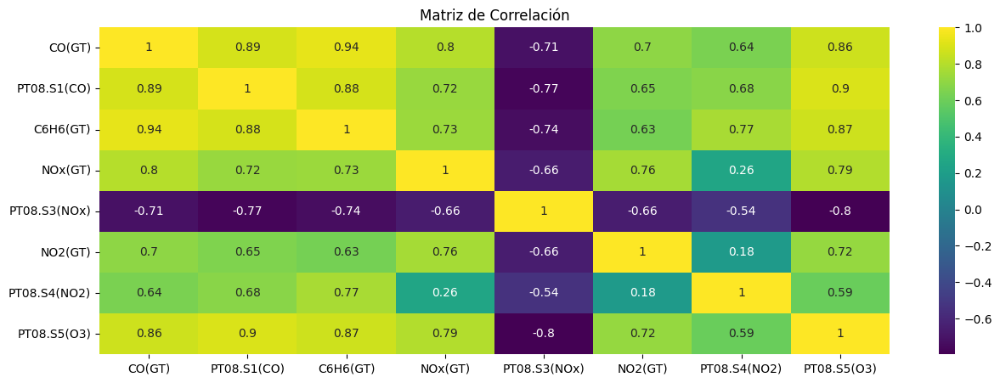

In [ ]:
""" original
correlation_matrix = df_imputado[['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH']].corr()  #Eliminamos la columna del sensor 'PT08.S2(NMHC)'
"""
#nuevo segun los comentarios
correlation_matrix = df_imputado[['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']].corr()  #Eliminamos la columna del sensor 'PT08.S2(NMHC)'
#"""
# Crea la figura con el tamaño deseado
plt.figure(figsize=(15,5))
sns.heatmap(correlation_matrix, annot=True, cmap="viridis")
plt.title('Matriz de Correlación')
plt.show()

En el siguiente grafico hemos añadido un cluster para representar las relaciones de una manera mas sencilla.

<Figure size 1500x500 with 0 Axes>

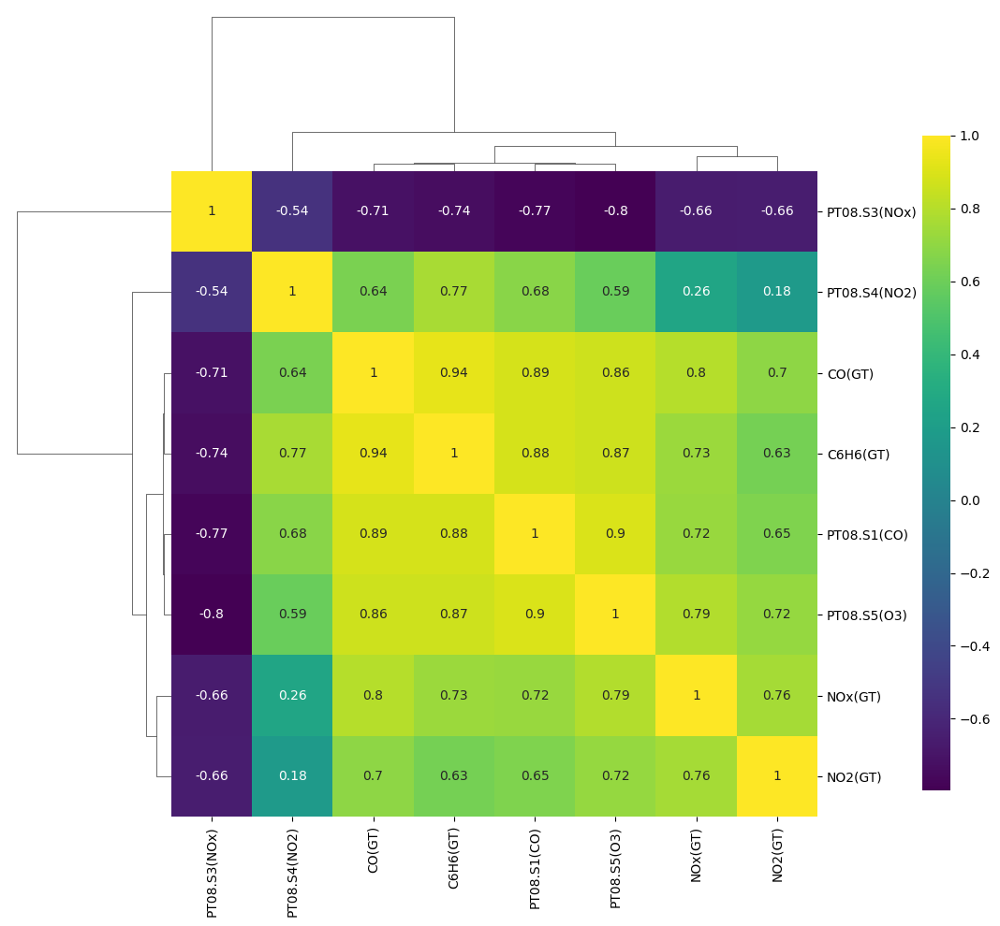

In [ ]:
# Define la posición de la barra de color
cbar_pos = (0.99, 0.15, 0.03, 0.7)  # (izquierda, abajo, ancho, altura)
plt.figure(figsize=(15,5))
# Crea el clustermap con la barra de color personalizada
g = sns.clustermap(correlation_matrix, annot=True, cmap="viridis", cbar_pos=cbar_pos)

plt.show()

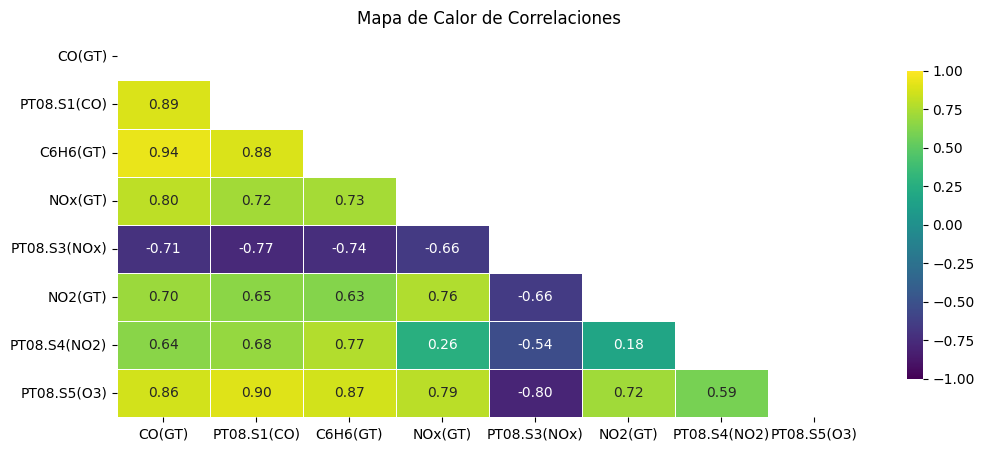

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Supongamos que df es tu DataFrame original
# Calcular la matriz de correlación
""" Datos original
corr = df_imputado[['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH']].corr()
"""
#Datos segun los comentarios
corr = df_imputado[['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)']].corr()
#"""
# Crear una máscara para el triángulo superior
mask = np.triu(np.ones_like(corr, dtype=bool))

# Establecer el tamaño de la figura
plt.figure(figsize=(12, 5))

# Dibujar el mapa de calor con la máscara y el ajuste de aspecto
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap='viridis', vmin=-1, vmax=1, linewidths=.5, cbar_kws={"shrink": .8})

plt.title('Mapa de Calor de Correlaciones')
plt.show()


In [ ]:
# Obtener el triángulo inferior de la matriz de correlación
corr_unstacked = corr.where(np.tril(np.ones(corr.shape), k=-1).astype(bool))

# Convertir a formato de tabla
corr_pairs = corr_unstacked.unstack().reset_index()
corr_pairs.columns = ['Variable 1', 'Variable 2', 'Correlación']

# Filtrar las correlaciones más fuertes (absolutas mayores a 0.7)
strong_corr = corr_pairs[(corr_pairs['Correlación'].abs() > 0.7) & (corr_pairs['Correlación'] != 1)]

# Ordenar por la magnitud de la correlación
strong_corr = strong_corr.sort_values(by='Correlación', ascending=False, key=abs)

print("Correlaciones más fuertes:")
print(strong_corr)


Correlaciones más fuertes:
      Variable 1    Variable 2  Correlación
2         CO(GT)      C6H6(GT)     0.935574
15   PT08.S1(CO)   PT08.S5(O3)     0.899324
1         CO(GT)   PT08.S1(CO)     0.886607
10   PT08.S1(CO)      C6H6(GT)     0.883795
23      C6H6(GT)   PT08.S5(O3)     0.865689
7         CO(GT)   PT08.S5(O3)     0.861707
3         CO(GT)       NOx(GT)     0.799323
39  PT08.S3(NOx)   PT08.S5(O3)    -0.796569
31       NOx(GT)   PT08.S5(O3)     0.793371
12   PT08.S1(CO)  PT08.S3(NOx)    -0.771938
22      C6H6(GT)  PT08.S4(NO2)     0.765731
29       NOx(GT)       NO2(GT)     0.760493
20      C6H6(GT)  PT08.S3(NOx)    -0.735744
19      C6H6(GT)       NOx(GT)     0.728973
11   PT08.S1(CO)       NOx(GT)     0.722844
47       NO2(GT)   PT08.S5(O3)     0.715508
4         CO(GT)  PT08.S3(NOx)    -0.713122


En esta tabla de correlaciones mas fuertes podemos ver que incluso hay correlaciones fuertes entre sensores tanto positivas como negativas. y relaciones tambien entre contaminantes como por ejemplo el monoxido de carbono y el benceno.

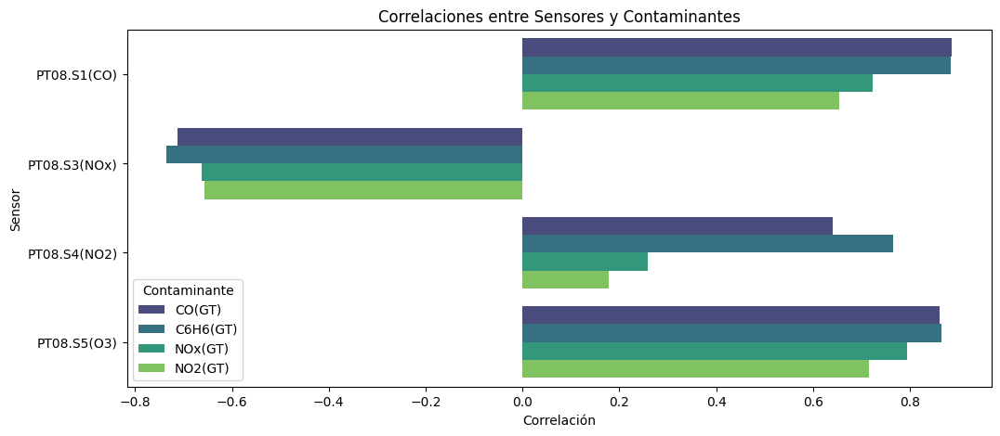

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


# Definir los sensores PT08 y los contaminantes
sensores_pt08 = ['PT08.S1(CO)',  'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
#contaminantes = ['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)', 'T', 'RH', 'AH'] #Original
contaminantes = ['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)'] # Corregido


# Calcular la matriz de correlación
corr = df_imputado.corr()

# Filtrar las correlaciones entre sensores PT08 y contaminantes
filtered_corr = corr.loc[sensores_pt08, contaminantes]

# Crear una tabla con las correlaciones
corr_table = filtered_corr.stack().reset_index()
corr_table.columns = ['Sensor', 'Contaminante', 'Correlación']

# Crear un gráfico de barras para visualizar las correlaciones
plt.figure(figsize=(12, 5))
sns.barplot(data=corr_table, x='Correlación', y='Sensor', hue='Contaminante', palette='viridis')
plt.title('Correlaciones entre Sensores y Contaminantes')
plt.show()




En este grafico se observa como los sensores no estan solamente correlacionados con su contaminante. Un sensor especifico para un contaminante se relaciona tambien con otros. Podemos ver esto en mas detalle en la siguiente tabla con sus respectivos valores por sensor.

In [ ]:
# Mostrar la tabla con las correlaciones
corr_table

,Sensor,Contaminante,Correlación
0,PT08.S1(CO),CO(GT),0.886607
1,PT08.S1(CO),C6H6(GT),0.883795
2,PT08.S1(CO),NOx(GT),0.722844
3,PT08.S1(CO),NO2(GT),0.654267
4,PT08.S3(NOx),CO(GT),-0.713122
5,PT08.S3(NOx),C6H6(GT),-0.735744
6,PT08.S3(NOx),NOx(GT),-0.662817
7,PT08.S3(NOx),NO2(GT),-0.655873
8,PT08.S4(NO2),CO(GT),0.641237
9,PT08.S4(NO2),C6H6(GT),0.765731


<ipython-input-53-a223ffaba975>:32: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm)


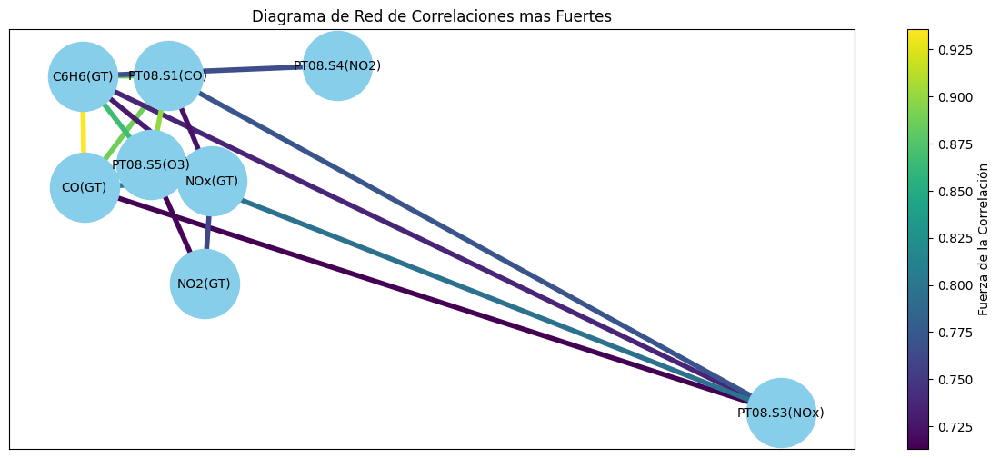

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

# Crear el grafo
G = nx.Graph()

# Añadir nodos y aristas con pesos
for _, row in strong_corr.iterrows():
    G.add_edge(row['Variable 1'], row['Variable 2'], weight=row['Correlación'])

# Dibujar el grafo
pos = nx.spring_layout(G, k=0.8)  # Posiciones de los nodos en el gráfico
edges = G.edges(data=True)
weights = [abs(edge[2]['weight']) for edge in edges]  # Pesos de las aristas

plt.figure(figsize=(15, 6))
# Dibujar nodos
nx.draw_networkx_nodes(G, pos, node_size=3000, node_color='skyblue')
# Dibujar etiquetas de nodos
nx.draw_networkx_labels(G, pos, font_size=10)
# Dibujar aristas con pesos
edge_collection = nx.draw_networkx_edges(G, pos, edgelist=edges, width=4, edge_color=weights, edge_cmap=plt.cm.viridis)

# Crear un ScalarMappable para la colorbar
norm = mcolors.Normalize(vmin=min(weights), vmax=max(weights))
sm = cm.ScalarMappable(cmap=plt.cm.viridis, norm=norm)
sm.set_array([])

# Añadir la colorbar
cbar = plt.colorbar(sm)
cbar.set_label('Fuerza de la Correlación')

plt.title('Diagrama de Red de Correlaciones mas Fuertes')
plt.show()


##Conclusiones del analisis de correlacion

No se puede concluir que los sensores esten solamente relacionados con con su contaminante especifico ya que de este análisis se observa que hay muchas correlaciones de distinto grado de intensidad, tanto entre sensores y contaminantes, entre contaminantes entre si, como entre sensores entre si incluvise.

A.- El sensor PT08.S3 especifico para Oxidos de Nitrogeno, presenta incluso correlaciones negativas con los contaminantes dioxido de nitrogeno y y oxido de nitrogeno (NO y NOx). Ver grafico de contaminantes sensores. Posiblemente este sensor tuvo algún fallo en su funcionamiento.

B.-Es importante destacar que no hay correlacines negativas significativas entre contaminantes ni con las variables climaticas. Esto podria ser importante para las predicciones sobre el clima, debido a que seria deseable saber que variable hace disminuir a uno u otro contaminante.

C.- En general cada sensor se correlaciona con varios contaminantes, tal vez esto pueda deberse a falta de calibracion de los sensores especificos.

# 2.¿Existe alguna relación entre las condiciones ambientales y la concentración de los contaminantes analizados?

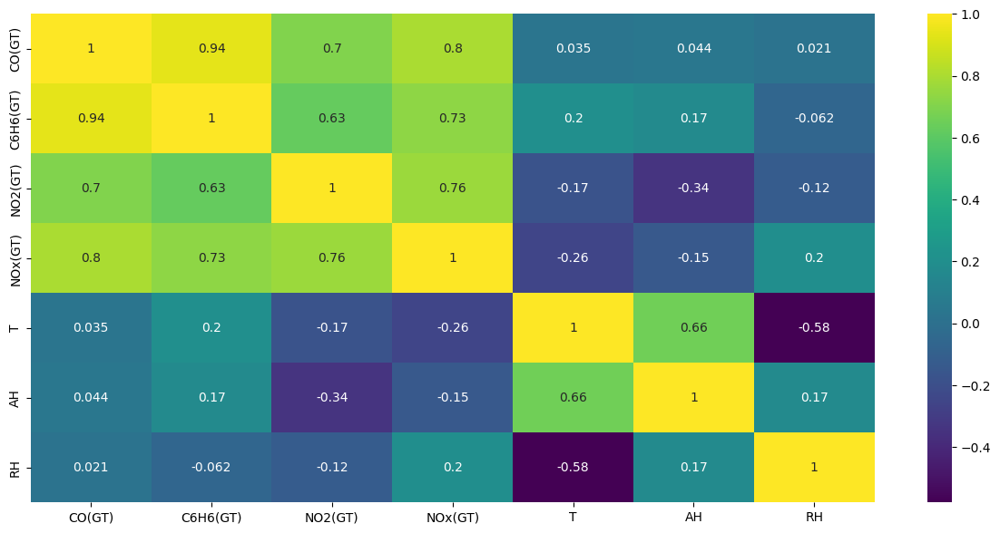

In [ ]:
correlacion=df_imputado[['CO(GT)', 'C6H6(GT)', 'NO2(GT)', 'NOx(GT)', 'T', 'AH', 'RH']].corr()
fig=plt.figure(figsize=(15,7))
sns.heatmap(correlacion, annot=True, cmap="viridis")
plt.show()

<ipython-input-55-dcbaae327b7c>:13: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax =plt.subplot(num_plots, 1, i)  # Crear una subgráfica


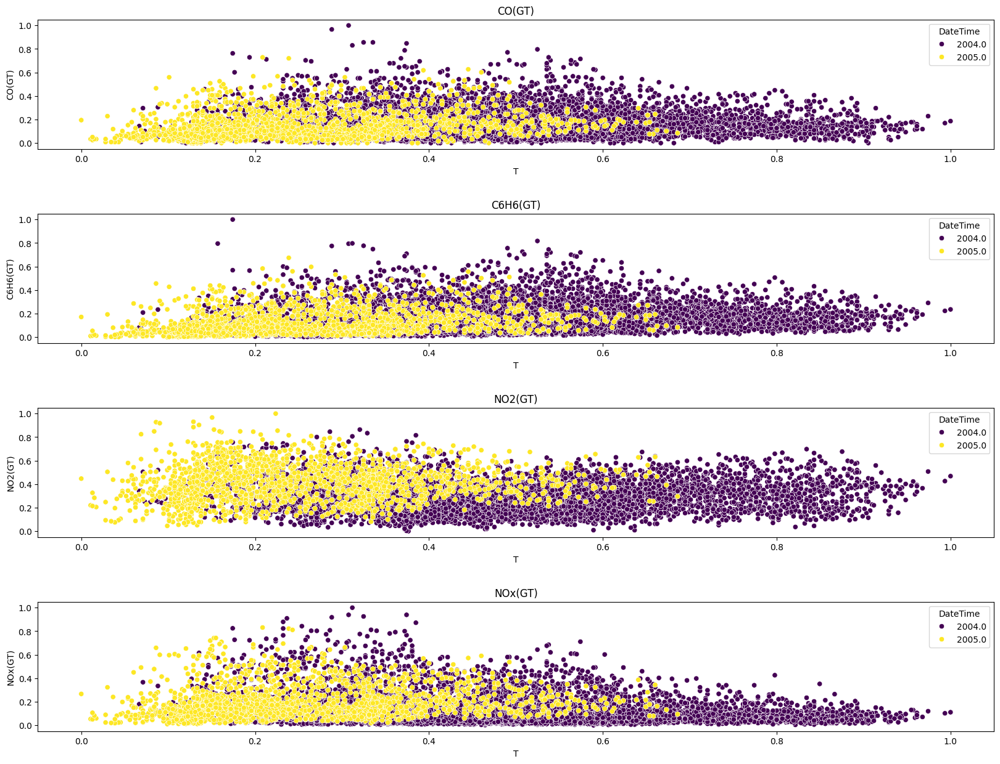

<Figure size 640x480 with 0 Axes>

In [ ]:
# Graficamos la concentracion de los contaminantes con la temperatura
# Crear la figura y los ejes
fig, axes = plt.subplots(figsize=(20, 15), sharex=True)

contaminantes= ['CO(GT)', 'C6H6(GT)', 'NO2(GT)', 'NOx(GT)']

# Definir el número de subgráficas
num_plots = len(contaminantes)

year = df_imputado['DateTime'].dt.year
# Iterar sobre cada columna de gas
for i, col in enumerate(df_imputado[contaminantes], start=1):
    ax =plt.subplot(num_plots, 1, i)  # Crear una subgráfica
    sns.scatterplot(x=df_imputado['T'], y=col, hue= year, data=df_imputado, palette='viridis')
    #ax.set_title(col, y=0.5, loc='')  # Título de la subvista
    ax.set_title(col)
plt.subplots_adjust(hspace=0.5)
# Mostrar la gráfica
plt.show()
plt.tight_layout()


<ipython-input-56-54581a225298>:12: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(num_plots, 1, i)  # Crear una subgráfica


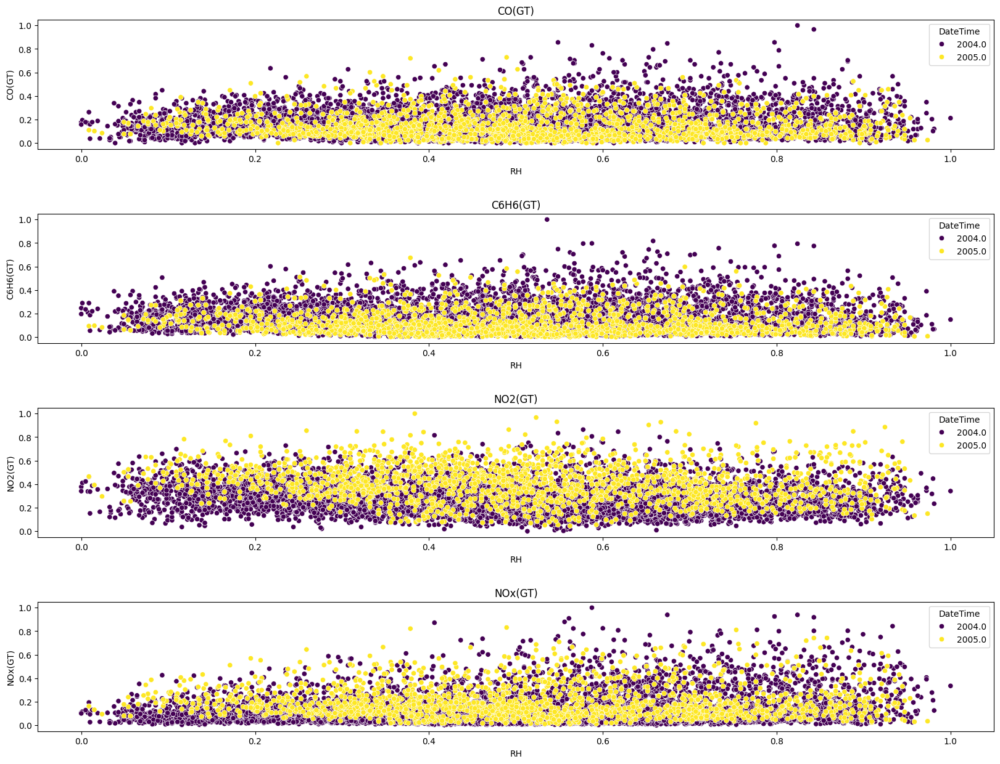

<Figure size 640x480 with 0 Axes>

In [ ]:
#Graficamos la concentracion de los contaminantes con la Humedad relativa

fig, axes = plt.subplots(figsize=(20, 15), sharex=True)

contaminantes= ['CO(GT)', 'C6H6(GT)', 'NO2(GT)', 'NOx(GT)']

# Definir el número de subgráficas
num_plots = len(contaminantes)
year = df_imputado['DateTime'].dt.year
# Iterar sobre cada columna de gas
for i, col in enumerate(df_imputado[contaminantes], start=1):
    ax = plt.subplot(num_plots, 1, i)  # Crear una subgráfica
    sns.scatterplot(x=df_imputado['RH'], y=col, hue=year, data=df_imputado, palette='viridis')
    #plt.title(col, y=0.5, loc='')  # Título de la subvista
    ax.set_title(col)
plt.subplots_adjust(hspace=0.5)

# Mostrar la gráfica
plt.show()
plt.tight_layout()



<ipython-input-57-62b469688a6b>:12: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(num_plots, 1, i)  # Crear una subgráfica


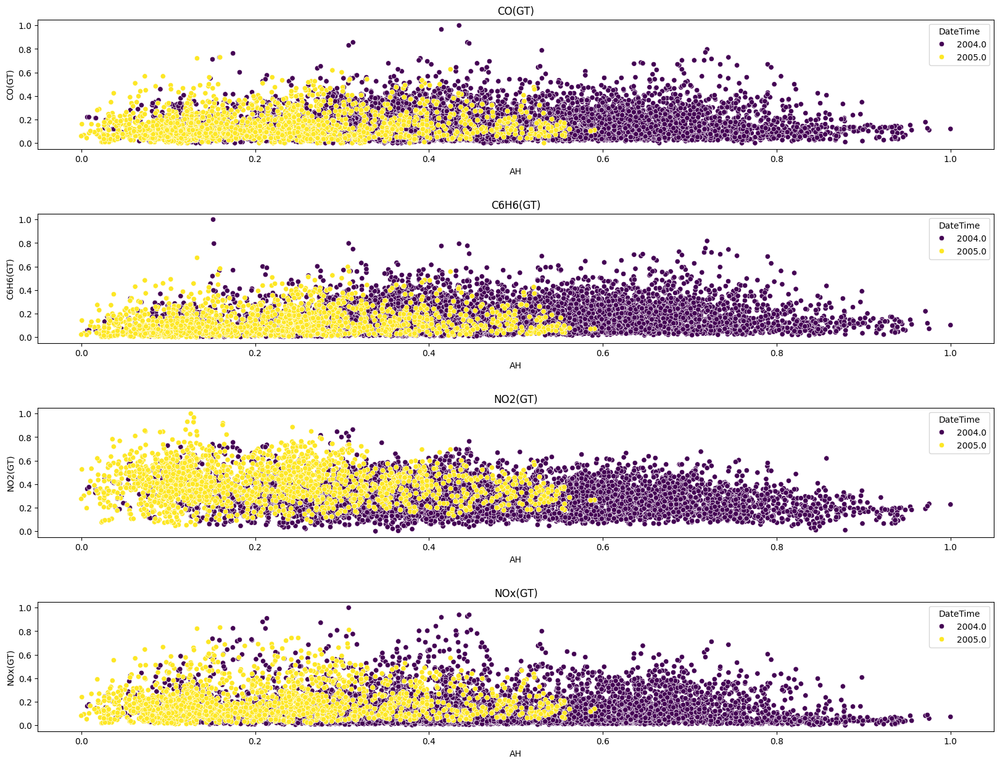

<Figure size 640x480 with 0 Axes>

In [ ]:
# Graficamos cada contaminante con la humedad absoluta

fig, axes = plt.subplots(figsize=(20, 15), sharex=True)

contaminantes= ['CO(GT)', 'C6H6(GT)', 'NO2(GT)', 'NOx(GT)']

# Definir el número de subgráficas
num_plots = len(contaminantes)
year = df_imputado['DateTime'].dt.year
# Iterar sobre cada columna de gas
for i, col in enumerate(df_imputado[contaminantes], start=1):
    ax = plt.subplot(num_plots, 1, i)  # Crear una subgráfica
    sns.scatterplot(x=df_imputado['AH'], y=col, hue=year, data=df_imputado, palette='viridis')
    #plt.title(col, y=0.5, loc='')  # Título de la subvista
    ax.set_title(col)
plt.subplots_adjust(hspace=0.5)

# Mostrar la gráfica
plt.show()
plt.tight_layout()



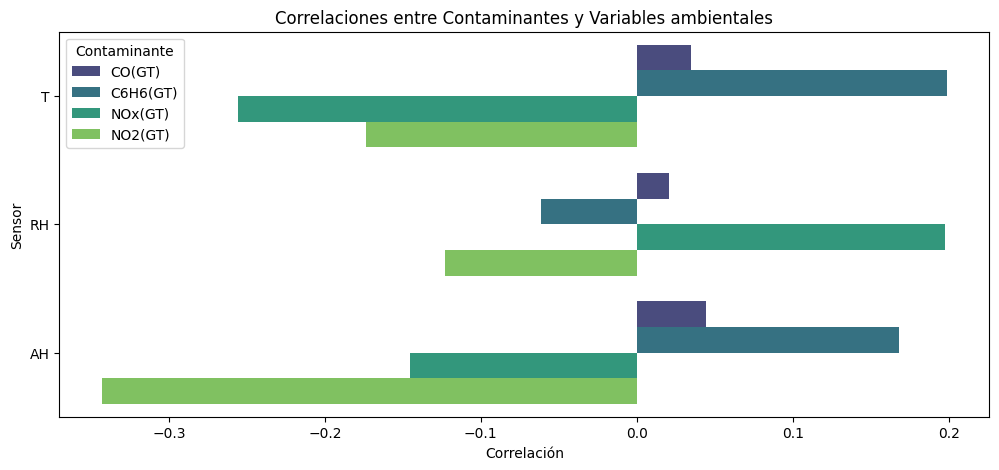

In [ ]:
# Definir los sensores PT08 y los contaminantes
ambientales = ['T', 'RH', 'AH']
contaminantes = ['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)']

# Calcular la matriz de correlación
#corr = df_imputado.corr()

# Filtrar las correlaciones entre sensores PT08 y contaminantes
filtered_corr = correlacion.loc[ambientales, contaminantes]

# Crear una tabla con las correlaciones
corr_table = filtered_corr.stack().reset_index()
corr_table.columns = ['Sensor', 'Contaminante', 'Correlación']

# Crear un gráfico de barras para visualizar las correlaciones
plt.figure(figsize=(12, 5))
sns.barplot(data=corr_table, x='Correlación', y='Sensor', hue='Contaminante', palette='viridis')
plt.title('Correlaciones entre Contaminantes y Variables ambientales')
plt.show()

##Conclusiones sobre la relacion de las variables ambientales:

Relaciones entre Contaminantes y Variables Ambientales:

T (Temperatura):

Tiene una correlación muy baja y positiva con CO(GT) (0.035). C6H6(GT) (0.20).

Tiene una correlación negativa con NO2(GT) (-0.17) y NOx(GT) (-0.26).

AH (Humedad Absoluta):

Tiene correlaciones muy bajas pero positivas con CO(GT) (0.044), C6H6(GT) (0.17)

Correlaciones muy bajas pero negativas con NO2(GT) (-0.34) y NOx(GT) (-0.15).

RH (Humedad Relativa):

Tiene correlaciones muy bajas pero positivas  con CO(GT) (0.021),  y NOx(GT) (0.20).

Correlaciones muy bajas pero negativas con C6H6(GT) (-0.062), NO2(GT) (-0.12)

# 3.¿Hay correlación significativa entre las concentraciones de `CO, C6H6,  NOx y NO2`, y las respuestas de los sensores de gas S1, S3, S4 y S5?

In [ ]:
df_imputado.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'DateTime'],
      dtype='object')

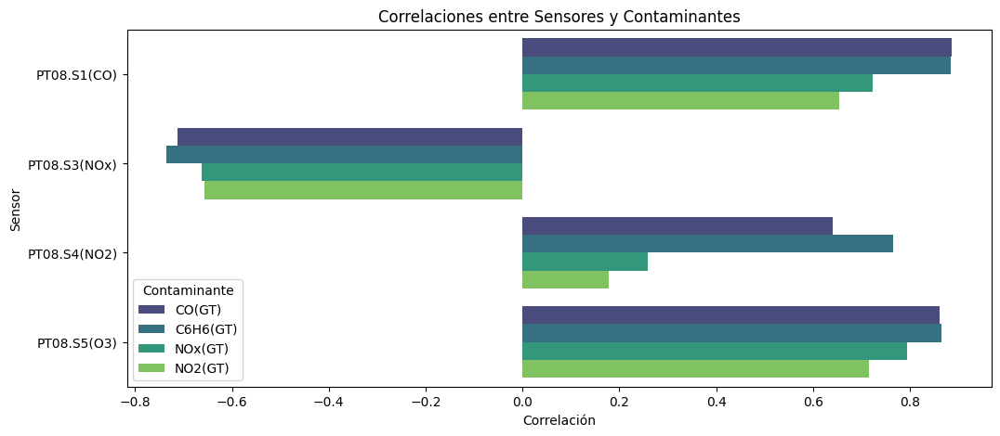

In [ ]:
# Definir los sensores PT08 y los contaminantes
sensores_pt08 = ['PT08.S1(CO)',  'PT08.S3(NOx)', 'PT08.S4(NO2)', 'PT08.S5(O3)']
contaminantes = ['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)']

# Calcular la matriz de correlación
#corr = df_imputado['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)',  'NOx(GT)',
#       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)'].corr()

# Filtrar las correlaciones entre sensores PT08 y contaminantes
filtered_corr = corr.loc[sensores_pt08, contaminantes]

# Crear una tabla con las correlaciones
corr_table = filtered_corr.stack().reset_index()
corr_table.columns = ['Sensor', 'Contaminante', 'Correlación']

# Crear un gráfico de barras para visualizar las correlaciones
plt.figure(figsize=(12, 5))
sns.barplot(data=corr_table, x='Correlación', y='Sensor', hue='Contaminante', palette='viridis')
plt.title('Correlaciones entre Sensores y Contaminantes')
plt.show()

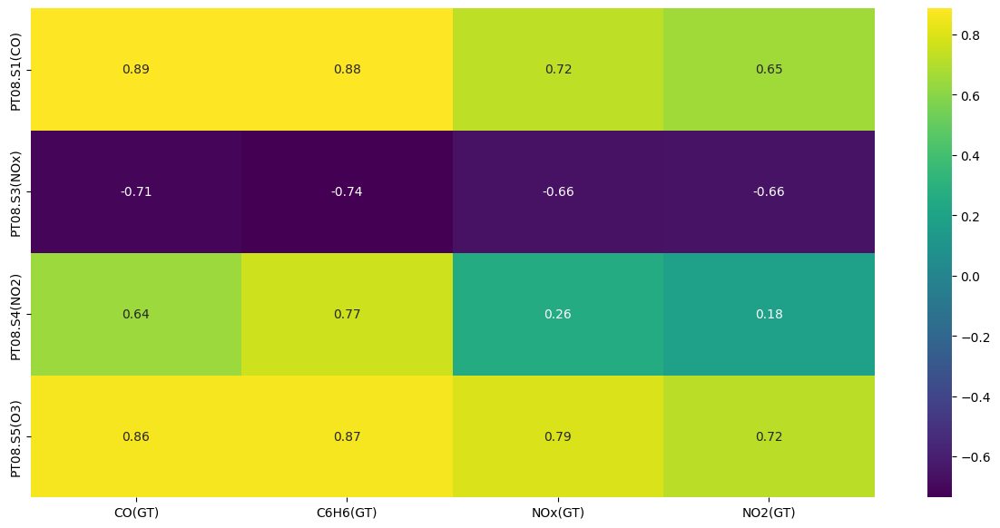

In [ ]:
fig=plt.figure(figsize=(15,7))
sns.heatmap(filtered_corr, annot=True, cmap="viridis")
plt.show()

##Conclusiones sobre la relación Sensor-Contaminante:

PT08.S1(CO) es  efectivos para medir CO(GT) pero tambien muestra gran correlacion con el C6H6(GT)

PT08.S3(NOx) Tiene una correlacion negativa con todos los contaminantes. Puede deberse a una falta de calibracion

PT08.S4(NO2) Muestra mayores correlaciones con CO y C6H6, que con sus contaminantes objetivos.



PT08.S5(O3) se correlaciona positivamente con todos los contaminantes parece tener una utilidad más general.

Eficiencia de Sensores:

Vemos entonces que las correlaciones positivas no son tan precisas esto puede sugerir que algunos sensores no son adecuandos para medir a ciertos contaminantes o que necesiten una calibración más precisa para su correcto funcionamiento



In [ ]:
df_imputado.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
count,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8991.000000,8625
mean,0.166295,0.325078,0.156967,0.303743,0.153772,0.217490,0.319033,0.407043,0.348352,0.434792,0.503575,0.410903,2004-09-12 04:44:31.304347904
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2004-03-10 18:00:00
25%,0.076271,0.208184,0.067610,0.191972,0.059580,0.142313,0.211480,0.303957,0.221764,0.294624,0.334591,0.269804,2004-06-10 07:00:00
50%,0.135593,0.298636,0.127358,0.287275,0.111036,0.204998,0.305740,0.410072,0.322328,0.423656,0.508176,0.396178,2004-09-12 13:00:00
75%,0.220339,0.419239,0.218553,0.400328,0.203724,0.274248,0.401813,0.504946,0.457211,0.565591,0.670440,0.551728,2004-12-11 10:00:00
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2005-03-20 08:00:00
std,0.119393,0.155836,0.117136,0.145730,0.134804,0.108775,0.141027,0.155669,0.173104,0.189938,0.217823,0.197338,NaN


In [ ]:
df_imputado.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'DateTime'],
      dtype='object')

In [ ]:
df_imputado.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'DateTime'],
      dtype='object')

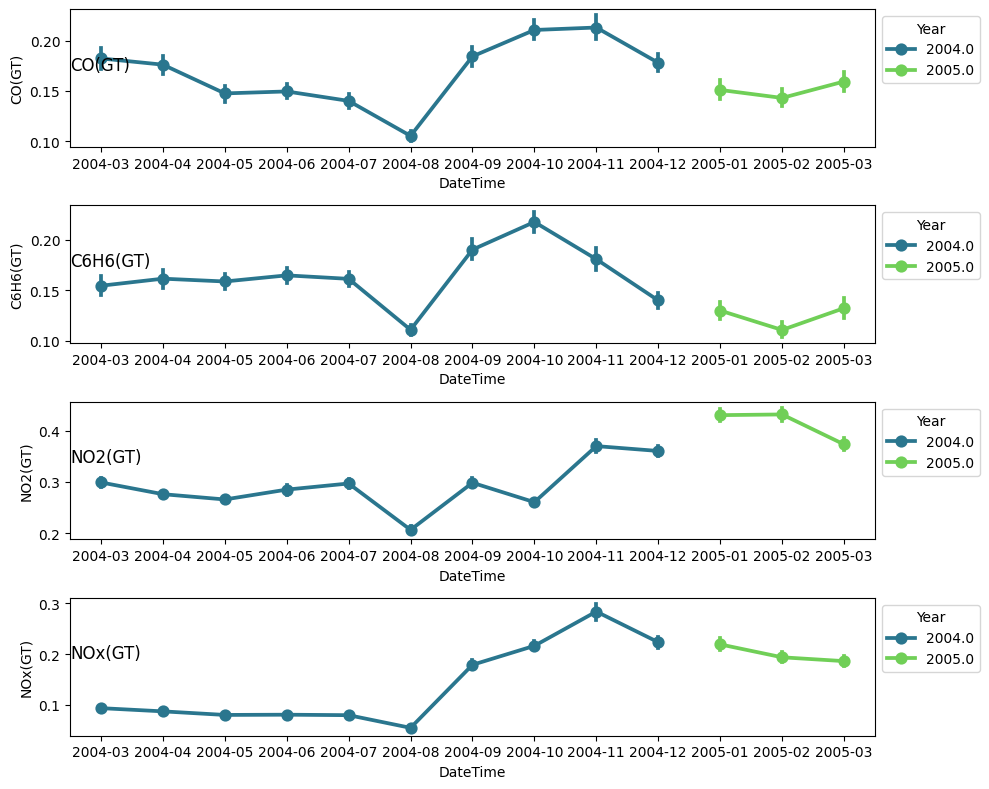

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Especificar el formato correcto de la fecha y convertir a datetime
#df_imputado['Date'] = pd.to_datetime(df_imputado['Date'], format='%d/%m/%Y', dayfirst=True)

# Extraer el año y crear una nueva columna
# Creando la columna YearMonth en base a la columna Date
year = df_imputado['DateTime'].dt.year
YearMonth = df_imputado['DateTime'].dt.to_period('M')

plt.figure(figsize=(10, 8))

# Lista de gases a mostrar
gasList = ['CO(GT)', 'C6H6(GT)', 'NO2(GT)','NOx(GT)']

#Definir la paleta 'viridis'
viridis_palette = sns.color_palette('viridis', 256)

# Seleccionar dos colores de la paleta 'viridis'
color1 = viridis_palette[100]
color2 = viridis_palette[200]

# Graficando los datos
for i, col in enumerate(gasList, start=1):
    plt.subplot(len(gasList), 1, i)
    sns.pointplot(x=YearMonth, y=col, hue=year, data=df_imputado, palette=[color1,color2])
    plt.title(col, y=0.5, loc='left')
    # Colocar la leyenda en una ubicación diferente
    plt.legend(title='Year', loc='upper left', bbox_to_anchor=(1, 1))



plt.tight_layout()
plt.show()


In [ ]:
df_imputado.columns

Index(['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)', 'PT08.S2(NMHC)', 'NOx(GT)',
       'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)', 'PT08.S5(O3)', 'T', 'RH',
       'AH', 'DateTime'],
      dtype='object')

#Analisis Complementario para Futura Implementacion de Modelos de Machine Learning

### Analizamos los outliers

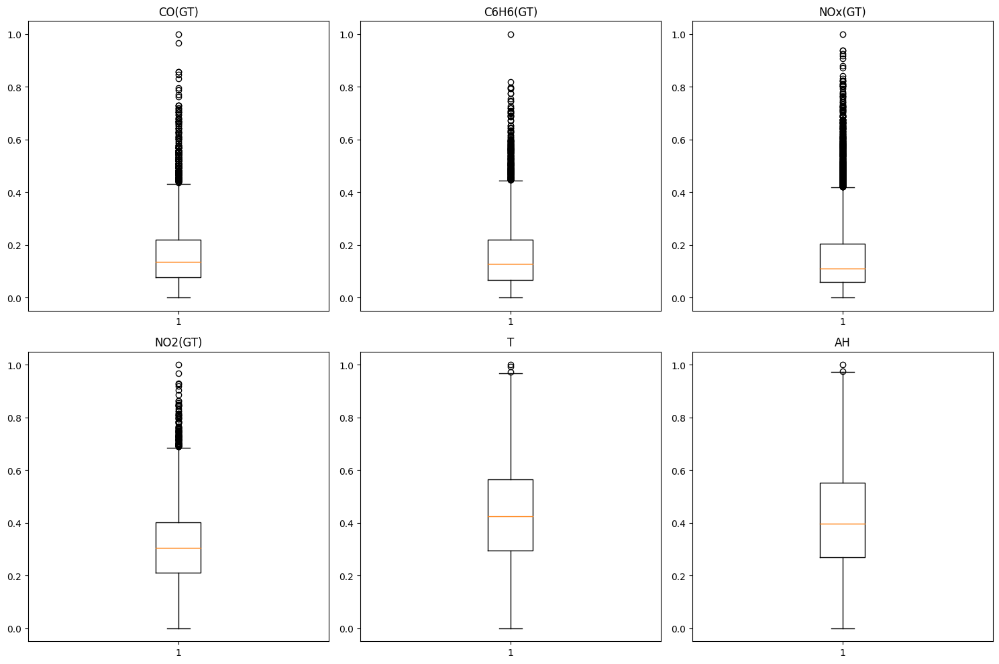

In [ ]:
columnas_boxplot = ['CO(GT)',  'C6H6(GT)',
                   'NOx(GT)',  'NO2(GT)',
                   'T', 'AH']

# Crea la figura y los ejes
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Itera sobre las columnas y crea un boxplot en cada subplot
for i, columna in enumerate(columnas_boxplot):
    row = i // 3  # Calcula la fila del subplot
    col = i % 3  # Calcula la columna del subplot
    axes[row, col].boxplot(df_imputado[columna])
    axes[row, col].set_title(columna)

# Ajusta el espacio entre los subplots
plt.tight_layout()

# Muestra la figura
plt.show()


In [ ]:
# analizamos la columna de los bencenos

df_imputado['C6H6(GT)'].describe()

,C6H6(GT)
count,8991.000000
mean,0.156967
std,0.117136
min,0.000000
25%,0.067610
50%,0.127358
75%,0.218553
max,1.000000


In [ ]:
continuous_feature=['CO(GT)', 'PT08.S1(CO)', 'C6H6(GT)',
       'PT08.S2(NMHC)', 'NOx(GT)', 'PT08.S3(NOx)', 'NO2(GT)', 'PT08.S4(NO2)',
       'PT08.S5(O3)', 'T', 'RH', 'AH']

In [ ]:
dimension_data_anterior = df_imputado.shape[0]
dimension_data_anterior

8991

In [ ]:
outlier_height_por_iqr=pd.DataFrame()
data = df_imputado.copy()

for column in continuous_feature:
  iqr = data[column].quantile(0.75) - data[column].quantile(0.25) #3er cuartil - 1er cuartil
  limite_superior = data[column].quantile(0.75) + 1.5*iqr
  limite_inferior = data[column].quantile(0.25) - 1.5*iqr
  outlier_height_por_iqr = pd.concat([outlier_height_por_iqr, data[(data[column] > limite_superior) | (data[column]< limite_inferior)]])
  data = data.loc[(data[column] <= limite_superior) & (data[column] >= limite_inferior)]

In [ ]:
outlier_height_por_iqr.describe()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
count,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1241.000000,1175
mean,0.317961,0.488100,0.294388,0.445042,0.350218,0.181819,0.446850,0.481988,0.537246,0.345815,0.578815,0.355480,2004-10-19 19:58:55.659574400
min,0.000000,0.000000,0.000000,0.000000,0.004739,0.000000,0.003021,0.000000,0.000000,0.027957,0.042767,0.018472,2004-03-11 00:00:00
25%,0.220339,0.386935,0.191824,0.370289,0.204875,0.062262,0.331118,0.328687,0.463076,0.240860,0.436478,0.224063,2004-09-14 15:30:00
50%,0.345763,0.540560,0.309748,0.496450,0.392688,0.091063,0.476737,0.456835,0.612076,0.324731,0.582390,0.333040,2004-11-16 17:00:00
75%,0.432203,0.633166,0.418239,0.594211,0.482735,0.153325,0.595166,0.638939,0.705474,0.438710,0.724528,0.455163,2005-01-06 21:30:00
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.972327,1.000000,2005-03-20 02:00:00
std,0.180424,0.221547,0.178606,0.212257,0.206916,0.200027,0.204480,0.208584,0.250670,0.148904,0.198116,0.179377,NaN


In [ ]:
outlier_dimension = outlier_height_por_iqr.shape[0]
data_dimension=df_imputado.shape[0]

In [ ]:
print("Dimensiones de los datos originales:")  # Imprime las dimensiones de los datos originales
print(data_dimension)  # Imprime las dimensiones de los datos originales
print("Dimensiones de los datos con valores atípicos:")  # Imprime las dimensiones de los datos con valores atípicos
print(outlier_dimension)  # Imprime las dimensiones de los datos con valores atípicos


Dimensiones de los datos originales:
8991
Dimensiones de los datos con valores atípicos:
1241


<ipython-input-75-cff846cb62c2>:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  viridis = plt.cm.get_cmap('viridis', 10)


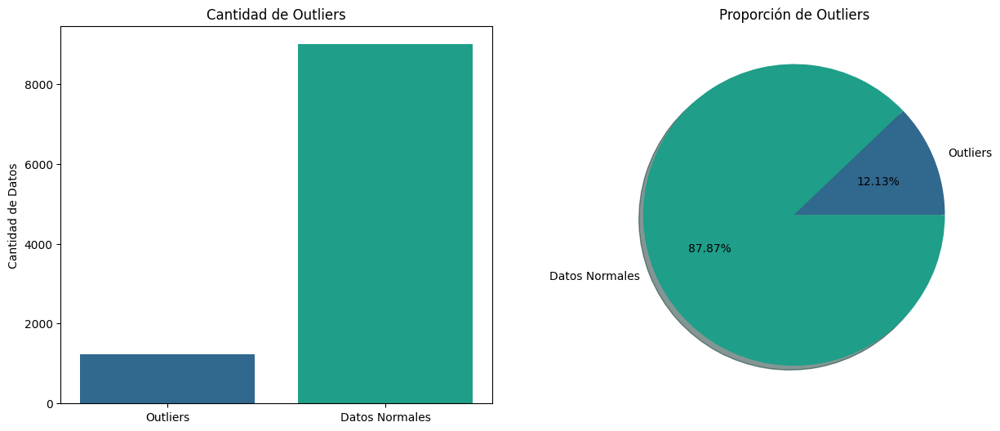

In [ ]:
import matplotlib.colors as mcolors

# Generar colores de la paleta 'viridis'
viridis = plt.cm.get_cmap('viridis', 10)
bar_colors = [viridis(3), viridis(5)]
pie_colors = [viridis(3), viridis(5)]

# Gráfico de barras
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
plt.bar(x=['Outliers', 'Datos Normales'], height=[outlier_dimension, data_dimension], color=bar_colors)
plt.title('Cantidad de Outliers')
plt.ylabel('Cantidad de Datos')

# Gráfico circular (pie chart)
plt.subplot(1, 2, 2)
labels = ['Outliers', 'Datos Normales']
sizes = [outlier_dimension, data_dimension]
plt.pie(sizes, labels=labels, autopct='%1.2f%%', colors=pie_colors, shadow=True)
plt.title('Proporción de Outliers')

plt.show()

Luego del analisis de los outliers, podemos ver que su proporcion no es elevada y como nuestro analisis esta tratando los outliers con cuidado ya que estos pueden ser claves para el comportamiento del nivel de contaminacion del aire y los eventos que generan estos niveles de contaminacion,por lo tanto `no retiraremos outliers`.

##Intentos de Agregar Datos

Luego de una intensa busqueda se pudo llegar al siguiente link donde se recopila informacion de contaminantes del aire en Italia, tomando como cuidad/region a Milan.

* https://www.eea.europa.eu/themes/air/country-fact-sheets/2023-country-fact-sheets/italy-air-pollution-country

* https://discomap.eea.europa.eu/map/fme/AirQualityExport.htm

Seleccionando solo un par de contaminantes a lo largo del periodo de un año de 2023 al 2024, para comparar el comportamiento de estas con los contaminantes que tenemos.

In [ ]:
CO = [
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_1.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_2.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_3.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_4.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_5.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_6.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_7.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_8.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_9.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_10.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_11.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_12.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/CO_13.csv"
]

C6H6 = [
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_1.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_2.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_3.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_4.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_5.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_6.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_7.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/C6H6_8.csv",

]

NO2 = [
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_1.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_2.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_3.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_4.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_5.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_6.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_7.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_8.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_9.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_10.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_11.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_12.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_13.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_14.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_15.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_16.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_17.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_18.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_19.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_20.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_21.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_22.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_23.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_24.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_25.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_26.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_27.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_28.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_29.csv",
    "https://raw.githubusercontent.com/MarielPalacio/Famaf-DiploDatos2024/main/NO2_30.csv",
]

###Contaminante: CO

In [ ]:
contaminante = CO
df_prueba = pd.DataFrame()
for i in range(len(contaminante )):
  df_aux = pd.read_csv(contaminante [i], delimiter=',')
  df_prueba = pd.concat([df_prueba, df_aux], ignore_index=True)

df_prueba

,Countrycode,Namespace,AirQualityNetwork,AirQualityStation,AirQualityStationEoICode,SamplingPoint,SamplingProcess,Sample,AirPollutant,AirPollutantCode,AveragingTime,Concentration,UnitOfMeasurement,DatetimeBegin,DatetimeEnd,Validity,Verification
0,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_10_NDIR_1988-07-01_00:00:00,SPP.IT0477A_10_NDIR_1988-07-01_00:00:00,SAM.IT0477A_10_NDIR_1988-07-01_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,1.068085,mg/m3,2023-01-02 00:00:00 +01:00,2023-01-02 01:00:00 +01:00,3,3
1,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_10_NDIR_1988-07-01_00:00:00,SPP.IT0477A_10_NDIR_1988-07-01_00:00:00,SAM.IT0477A_10_NDIR_1988-07-01_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,1.057611,mg/m3,2023-01-02 01:00:00 +01:00,2023-01-02 02:00:00 +01:00,3,3
2,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_10_NDIR_1988-07-01_00:00:00,SPP.IT0477A_10_NDIR_1988-07-01_00:00:00,SAM.IT0477A_10_NDIR_1988-07-01_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,1.033188,mg/m3,2023-01-02 02:00:00 +01:00,2023-01-02 03:00:00 +01:00,3,3
3,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_10_NDIR_1988-07-01_00:00:00,SPP.IT0477A_10_NDIR_1988-07-01_00:00:00,SAM.IT0477A_10_NDIR_1988-07-01_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,1.036865,mg/m3,2023-01-02 03:00:00 +01:00,2023-01-02 04:00:00 +01:00,3,3
4,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_10_NDIR_1988-07-01_00:00:00,SPP.IT0477A_10_NDIR_1988-07-01_00:00:00,SAM.IT0477A_10_NDIR_1988-07-01_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,1.070753,mg/m3,2023-01-02 04:00:00 +01:00,2023-01-02 05:00:00 +01:00,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82166,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_10_NDIR_2006-04-22_00:00:00,SPP.IT1792A_10_NDIR_2006-04-22_00:00:00,SAM.IT1792A_10_NDIR_2006-04-22_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,mg/m3,2024-03-12 05:00:00 +01:00,2024-03-12 06:00:00 +01:00,-1,3
82167,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_10_NDIR_2006-04-22_00:00:00,SPP.IT1792A_10_NDIR_2006-04-22_00:00:00,SAM.IT1792A_10_NDIR_2006-04-22_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,mg/m3,2024-03-12 06:00:00 +01:00,2024-03-12 07:00:00 +01:00,-1,3
82168,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_10_NDIR_2006-04-22_00:00:00,SPP.IT1792A_10_NDIR_2006-04-22_00:00:00,SAM.IT1792A_10_NDIR_2006-04-22_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,mg/m3,2024-03-12 07:00:00 +01:00,2024-03-12 08:00:00 +01:00,-1,3
82169,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_10_NDIR_2006-04-22_00:00:00,SPP.IT1792A_10_NDIR_2006-04-22_00:00:00,SAM.IT1792A_10_NDIR_2006-04-22_00:00:00,CO,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,mg/m3,2024-03-12 08:00:00 +01:00,2024-03-12 09:00:00 +01:00,-1,3


En todos los contaminantes hay datos de diferentes posiciones de estaciones de muestreo, revisando la lista y el mapa en la pagina fuente, tomaremos la estacion `IT0477A` que esta posicionada en pleno centro de Milan.

Ademas notemos que la unidad de este contaminante es en $mg/m^3$, por lo tanto convirtamos esta unidad a $\mu g/m^3$

In [ ]:
df_prueba = df_prueba[['AirQualityStationEoICode','Concentration', 'DatetimeBegin']]
df_prueba = df_prueba[df_prueba['AirQualityStationEoICode']=='IT0477A']
df_prueba

,AirQualityStationEoICode,Concentration,DatetimeBegin
0,IT0477A,1.068085,2023-01-02 00:00:00 +01:00
1,IT0477A,1.057611,2023-01-02 01:00:00 +01:00
2,IT0477A,1.033188,2023-01-02 02:00:00 +01:00
3,IT0477A,1.036865,2023-01-02 03:00:00 +01:00
4,IT0477A,1.070753,2023-01-02 04:00:00 +01:00
...,...,...,...
66534,IT0477A,0.520092,2024-07-22 04:00:00 +01:00
66535,IT0477A,0.505987,2024-07-22 05:00:00 +01:00
66536,IT0477A,0.607533,2024-07-22 06:00:00 +01:00
66537,IT0477A,0.603964,2024-07-22 07:00:00 +01:00


In [ ]:
df_prueba[df_prueba['AirQualityStationEoICode']=='IT0477A'].info()

<class 'pandas.core.frame.DataFrame'>
Index: 13347 entries, 0 to 66538
Data columns (total 3 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   AirQualityStationEoICode  13347 non-null  object 
 1   Concentration             13058 non-null  float64
 2   DatetimeBegin             13347 non-null  object 
dtypes: float64(1), object(2)
memory usage: 933.1+ KB


In [ ]:
df_CO = df_prueba[['Concentration', 'DatetimeBegin']]
df_CO = df_CO.rename(columns={'Concentration': 'CO', 'DatetimeBegin': 'DateTime'})
df_CO

,CO,DateTime
0,1.068085,2023-01-02 00:00:00 +01:00
1,1.057611,2023-01-02 01:00:00 +01:00
2,1.033188,2023-01-02 02:00:00 +01:00
3,1.036865,2023-01-02 03:00:00 +01:00
4,1.070753,2023-01-02 04:00:00 +01:00
...,...,...
66534,0.520092,2024-07-22 04:00:00 +01:00
66535,0.505987,2024-07-22 05:00:00 +01:00
66536,0.607533,2024-07-22 06:00:00 +01:00
66537,0.603964,2024-07-22 07:00:00 +01:00


In [ ]:
df_CO.loc[:,'CO'] *= 1000

In [ ]:
# Verificamos si hay datos duplicados en la columna 'DateTime'
duplicados = df_CO['DateTime'].duplicated()

# Imprimimos resultados
if duplicados.any():
    print("Existen datos duplicados en la columna 'DateTime'.")
    print(df_CO[duplicados])
else:
    print("No hay datos duplicados en la columna 'DateTime'.")

No hay datos duplicados en la columna 'DateTime'.


###Contaminante: C6H6

In [ ]:
contaminante = C6H6
df_prueba = pd.DataFrame()
for i in range(len(contaminante )):
  df_aux = pd.read_csv(contaminante [i], delimiter=',')
  df_prueba = pd.concat([df_prueba, df_aux], ignore_index=True)

df_prueba

,Countrycode,Namespace,AirQualityNetwork,AirQualityStation,AirQualityStationEoICode,SamplingPoint,SamplingProcess,Sample,AirPollutant,AirPollutantCode,AveragingTime,Concentration,UnitOfMeasurement,DatetimeBegin,DatetimeEnd,Validity,Verification
0,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_20_GC-PID_2012-09-24_00:00:00,SPP.IT0477A_20_GC-PID_2012-09-24_00:00:00,SAM.IT0477A_20_GC-PID_2012-09-24_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,2.136875,µg/m3,2023-01-02 00:00:00 +01:00,2023-01-02 01:00:00 +01:00,3,3
1,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_20_GC-PID_2012-09-24_00:00:00,SPP.IT0477A_20_GC-PID_2012-09-24_00:00:00,SAM.IT0477A_20_GC-PID_2012-09-24_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,2.177500,µg/m3,2023-01-02 01:00:00 +01:00,2023-01-02 02:00:00 +01:00,3,3
2,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_20_GC-PID_2012-09-24_00:00:00,SPP.IT0477A_20_GC-PID_2012-09-24_00:00:00,SAM.IT0477A_20_GC-PID_2012-09-24_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,2.063750,µg/m3,2023-01-02 02:00:00 +01:00,2023-01-02 03:00:00 +01:00,3,3
3,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_20_GC-PID_2012-09-24_00:00:00,SPP.IT0477A_20_GC-PID_2012-09-24_00:00:00,SAM.IT0477A_20_GC-PID_2012-09-24_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,2.242500,µg/m3,2023-01-02 03:00:00 +01:00,2023-01-02 04:00:00 +01:00,3,3
4,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_20_GC-PID_2012-09-24_00:00:00,SPP.IT0477A_20_GC-PID_2012-09-24_00:00:00,SAM.IT0477A_20_GC-PID_2012-09-24_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,2.112500,µg/m3,2023-01-02 04:00:00 +01:00,2023-01-02 05:00:00 +01:00,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49476,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_20_GC-PID_2006-02-17_00:00:00,SPP.IT1792A_20_GC-PID_2006-02-17_00:00:00,SAM.IT1792A_20_GC-PID_2006-02-17_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,µg/m3,2024-03-12 05:00:00 +01:00,2024-03-12 06:00:00 +01:00,-1,3
49477,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_20_GC-PID_2006-02-17_00:00:00,SPP.IT1792A_20_GC-PID_2006-02-17_00:00:00,SAM.IT1792A_20_GC-PID_2006-02-17_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,µg/m3,2024-03-12 06:00:00 +01:00,2024-03-12 07:00:00 +01:00,-1,3
49478,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_20_GC-PID_2006-02-17_00:00:00,SPP.IT1792A_20_GC-PID_2006-02-17_00:00:00,SAM.IT1792A_20_GC-PID_2006-02-17_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,µg/m3,2024-03-12 07:00:00 +01:00,2024-03-12 08:00:00 +01:00,-1,3
49479,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT1792A,IT1792A,SPO.IT1792A_20_GC-PID_2006-02-17_00:00:00,SPP.IT1792A_20_GC-PID_2006-02-17_00:00:00,SAM.IT1792A_20_GC-PID_2006-02-17_00:00:00,C6H6,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,NaN,µg/m3,2024-03-12 08:00:00 +01:00,2024-03-12 09:00:00 +01:00,-1,3


In [ ]:
df_prueba = df_prueba[['AirQualityStationEoICode','Concentration', 'DatetimeBegin']]
df_prueba = df_prueba[df_prueba['AirQualityStationEoICode']=='IT0477A']
df_prueba

,AirQualityStationEoICode,Concentration,DatetimeBegin
0,IT0477A,2.136875,2023-01-02 00:00:00 +01:00
1,IT0477A,2.177500,2023-01-02 01:00:00 +01:00
2,IT0477A,2.063750,2023-01-02 02:00:00 +01:00
3,IT0477A,2.242500,2023-01-02 03:00:00 +01:00
4,IT0477A,2.112500,2023-01-02 04:00:00 +01:00
...,...,...,...
38447,IT0477A,NaN,2024-07-22 04:00:00 +01:00
38448,IT0477A,NaN,2024-07-22 05:00:00 +01:00
38449,IT0477A,NaN,2024-07-22 06:00:00 +01:00
38450,IT0477A,NaN,2024-07-22 07:00:00 +01:00


In [ ]:
df_C6H6 = df_prueba[['Concentration', 'DatetimeBegin']]
df_C6H6 = df_C6H6.rename(columns={'Concentration': 'C6H6', 'DatetimeBegin': 'DateTime'})
df_C6H6

,C6H6,DateTime
0,2.136875,2023-01-02 00:00:00 +01:00
1,2.177500,2023-01-02 01:00:00 +01:00
2,2.063750,2023-01-02 02:00:00 +01:00
3,2.242500,2023-01-02 03:00:00 +01:00
4,2.112500,2023-01-02 04:00:00 +01:00
...,...,...
38447,NaN,2024-07-22 04:00:00 +01:00
38448,NaN,2024-07-22 05:00:00 +01:00
38449,NaN,2024-07-22 06:00:00 +01:00
38450,NaN,2024-07-22 07:00:00 +01:00


In [ ]:
# Verificamos si hay datos duplicados en la columna 'DateTime'
duplicados = df_C6H6['DateTime'].duplicated()

# Imprimimos resultados
if duplicados.any():
    print("Existen datos duplicados en la columna 'DateTime'.")
    print(df_C6H6[duplicados])
else:
    print("No hay datos duplicados en la columna 'DateTime'.")

No hay datos duplicados en la columna 'DateTime'.


###Contaminante: NO2

In [ ]:
contaminante = NO2
df_prueba = pd.DataFrame()
for i in range(len(contaminante )):
  df_aux = pd.read_csv(contaminante [i], delimiter=',')
  df_prueba = pd.concat([df_prueba, df_aux], ignore_index=True)

df_prueba

,Countrycode,Namespace,AirQualityNetwork,AirQualityStation,AirQualityStationEoICode,SamplingPoint,SamplingProcess,Sample,AirPollutant,AirPollutantCode,AveragingTime,Concentration,UnitOfMeasurement,DatetimeBegin,DatetimeEnd,Validity,Verification
0,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_8_chemi_1973-11-01_00:00:00,SPP.IT0477A_8_chemi_1973-11-01_00:00:00,SAM.IT0477A_8_chemi_1973-11-01_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,33.614986,µg/m3,2023-01-02 00:00:00 +01:00,2023-01-02 01:00:00 +01:00,3,3
1,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_8_chemi_1973-11-01_00:00:00,SPP.IT0477A_8_chemi_1973-11-01_00:00:00,SAM.IT0477A_8_chemi_1973-11-01_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,32.548874,µg/m3,2023-01-02 01:00:00 +01:00,2023-01-02 02:00:00 +01:00,3,3
2,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_8_chemi_1973-11-01_00:00:00,SPP.IT0477A_8_chemi_1973-11-01_00:00:00,SAM.IT0477A_8_chemi_1973-11-01_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,32.113090,µg/m3,2023-01-02 02:00:00 +01:00,2023-01-02 03:00:00 +01:00,3,3
3,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_8_chemi_1973-11-01_00:00:00,SPP.IT0477A_8_chemi_1973-11-01_00:00:00,SAM.IT0477A_8_chemi_1973-11-01_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,32.259650,µg/m3,2023-01-02 03:00:00 +01:00,2023-01-02 04:00:00 +01:00,3,3
4,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT0477A,IT0477A,SPO.IT0477A_8_chemi_1973-11-01_00:00:00,SPP.IT0477A_8_chemi_1973-11-01_00:00:00,SAM.IT0477A_8_chemi_1973-11-01_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,31.869263,µg/m3,2023-01-02 04:00:00 +01:00,2023-01-02 05:00:00 +01:00,3,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197660,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT2232A,IT2232A,SPO.IT2232A_8_chemi_2007-02-23_00:00:00,SPP.IT2232A_8_chemi_2007-02-23_00:00:00,SAM.IT2232A_8_chemi_2007-02-23_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,9.085887,µg/m3,2024-07-22 18:00:00 +01:00,2024-07-22 19:00:00 +01:00,3,3
197661,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT2232A,IT2232A,SPO.IT2232A_8_chemi_2007-02-23_00:00:00,SPP.IT2232A_8_chemi_2007-02-23_00:00:00,SAM.IT2232A_8_chemi_2007-02-23_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,9.679177,µg/m3,2024-07-22 19:00:00 +01:00,2024-07-22 20:00:00 +01:00,3,3
197662,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT2232A,IT2232A,SPO.IT2232A_8_chemi_2007-02-23_00:00:00,SPP.IT2232A_8_chemi_2007-02-23_00:00:00,SAM.IT2232A_8_chemi_2007-02-23_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,10.824304,µg/m3,2024-07-22 20:00:00 +01:00,2024-07-22 21:00:00 +01:00,3,3
197663,IT,IT.ISPRA.AQD,NET.IT082A,STA.IT2232A,IT2232A,SPO.IT2232A_8_chemi_2007-02-23_00:00:00,SPP.IT2232A_8_chemi_2007-02-23_00:00:00,SAM.IT2232A_8_chemi_2007-02-23_00:00:00,NO2,http://dd.eionet.europa.eu/vocabulary/aq/pollu...,hour,26.444153,µg/m3,2024-07-22 21:00:00 +01:00,2024-07-22 22:00:00 +01:00,3,3


In [ ]:
df_prueba = df_prueba[['AirQualityStationEoICode','Concentration', 'DatetimeBegin']]
df_prueba = df_prueba[df_prueba['AirQualityStationEoICode']=='IT0477A']
df_prueba

,AirQualityStationEoICode,Concentration,DatetimeBegin
0,IT0477A,33.614986,2023-01-02 00:00:00 +01:00
1,IT0477A,32.548874,2023-01-02 01:00:00 +01:00
2,IT0477A,32.113090,2023-01-02 02:00:00 +01:00
3,IT0477A,32.259650,2023-01-02 03:00:00 +01:00
4,IT0477A,31.869263,2023-01-02 04:00:00 +01:00
...,...,...,...
133174,IT0477A,18.784082,2024-07-22 04:00:00 +01:00
133175,IT0477A,13.099445,2024-07-22 05:00:00 +01:00
133176,IT0477A,27.939428,2024-07-22 06:00:00 +01:00
133177,IT0477A,30.558020,2024-07-22 07:00:00 +01:00


In [ ]:
df_NO2 = df_prueba[['Concentration', 'DatetimeBegin']]
df_NO2 = df_NO2.rename(columns={'Concentration': 'NO2', 'DatetimeBegin': 'DateTime'})
df_NO2

,NO2,DateTime
0,33.614986,2023-01-02 00:00:00 +01:00
1,32.548874,2023-01-02 01:00:00 +01:00
2,32.113090,2023-01-02 02:00:00 +01:00
3,32.259650,2023-01-02 03:00:00 +01:00
4,31.869263,2023-01-02 04:00:00 +01:00
...,...,...
133174,18.784082,2024-07-22 04:00:00 +01:00
133175,13.099445,2024-07-22 05:00:00 +01:00
133176,27.939428,2024-07-22 06:00:00 +01:00
133177,30.558020,2024-07-22 07:00:00 +01:00


In [ ]:
# Verificamos si hay datos duplicados en la columna 'DateTime'
duplicados = df_NO2['DateTime'].duplicated()

# Imprimimos resultados
if duplicados.any():
    print("Existen datos duplicados en la columna 'DateTime'.")
    print(df_NO2[duplicados])
else:
    print("No hay datos duplicados en la columna 'DateTime'.")

No hay datos duplicados en la columna 'DateTime'.


Uniendo toda la informacion

In [ ]:
new_info = df_CO.merge(df_C6H6, on='DateTime', how='inner').merge(df_NO2, on='DateTime', how='inner')
new_info

,CO,DateTime,C6H6,NO2
0,1068.085,2023-01-02 00:00:00 +01:00,2.136875,33.614986
1,1057.611,2023-01-02 01:00:00 +01:00,2.177500,32.548874
2,1033.188,2023-01-02 02:00:00 +01:00,2.063750,32.113090
3,1036.865,2023-01-02 03:00:00 +01:00,2.242500,32.259650
4,1070.753,2023-01-02 04:00:00 +01:00,2.112500,31.869263
...,...,...,...,...
13331,520.092,2024-07-22 04:00:00 +01:00,NaN,18.784082
13332,505.987,2024-07-22 05:00:00 +01:00,NaN,13.099445
13333,607.533,2024-07-22 06:00:00 +01:00,NaN,27.939428
13334,603.964,2024-07-22 07:00:00 +01:00,NaN,30.558020


In [ ]:
new_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13336 entries, 0 to 13335
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CO        13047 non-null  float64
 1   DateTime  13336 non-null  object 
 2   C6H6      12958 non-null  float64
 3   NO2       12301 non-null  float64
dtypes: float64(3), object(1)
memory usage: 416.9+ KB


In [ ]:
new_info.dropna()

,CO,DateTime,C6H6,NO2
0,1068.085,2023-01-02 00:00:00 +01:00,2.136875,33.614986
1,1057.611,2023-01-02 01:00:00 +01:00,2.177500,32.548874
2,1033.188,2023-01-02 02:00:00 +01:00,2.063750,32.113090
3,1036.865,2023-01-02 03:00:00 +01:00,2.242500,32.259650
4,1070.753,2023-01-02 04:00:00 +01:00,2.112500,31.869263
...,...,...,...,...
13262,781.309,2024-07-19 07:00:00 +01:00,1.657500,39.928658
13263,864.713,2024-07-19 08:00:00 +01:00,1.950000,39.106380
13264,697.303,2024-07-19 09:00:00 +01:00,1.893125,31.503515
13265,751.947,2024-07-19 10:00:00 +01:00,2.193750,36.201157


### Web Scrapping para Temperatura y Humedad

*Contexto*: La mayoria de estos codigos los hice en el 2020 para una actividad de Web Scrapping de la Licenciatura de Matematica Aplicada de FaMAF. Y luego de algunos ajustes y descubrir como se itera en base a fechas, se obtuvo informacion de la `Temperatura` y `Humedad` en Milan a lo largo de los periodos Enero 2023- Julio 2024, para que si machean los registros horarios con el datafran `new_info` anterior, se sume esta informacion a la informacion adicional parta el dataset final.

Fuente: https://www.tutiempo.net/registros/liml

In [ ]:
import urllib.request
from datetime import datetime, timedelta

Funciones adicionales para el scraping personalizado

In [ ]:
# Diccionario para traducir los meses de inglés a español
months_translation = {
    'January': 'enero', 'February': 'febrero', 'March': 'marzo', 'April': 'abril',
    'May': 'mayo', 'June': 'junio', 'July': 'julio', 'August': 'agosto',
    'September': 'septiembre', 'October': 'octubre', 'November': 'noviembre', 'December': 'diciembre'
}

# Función para convertir la cadena de fecha al objeto datetime
def str_to_datetime(date_str):
    # Convertir la cadena con el mes en español al formato datetime con el mes en inglés
    for eng, esp in months_translation.items():
        date_str = date_str.replace(esp, eng)
    return datetime.strptime(date_str, '%d-%B-%Y')

# Función para convertir el objeto datetime a la cadena de fecha en el formato '2-julio-2024' sin cero inicial
def datetime_to_str(date_obj):
    # Convertir la fecha al formato con el mes en inglés
    date_str = date_obj.strftime('%-d-%B-%Y')  # Usar '%-d' para evitar el cero inicial en días de un solo dígito
    # Traducir el mes de inglés a español
    for eng, esp in months_translation.items():
        date_str = date_str.replace(eng, esp)
    return date_str.lower()

# Función para convertir el objeto datetime a la cadena de fecha en el formato 'YYYY-MM-DD'
def datetime_to_str_2(date_obj):
    return date_obj.strftime('%Y-%m-%d')

def ultimosdos(lista): #como vi que tenia que hacer lo mismo para varios, lo generalice
  ultimosdos = []
  for i in range(0,len(lista)-1):
     aux = '' + lista[i]
    #  ultimosdos.append(aux[len(aux)-2:])
     ultimosdos.append(aux[-2:])
  return ultimosdos

In [ ]:
# Ejemplo de fechas en el formato dado
start_date_str = '2-enero-2023'
end_date_str = '19-julio-2024'

# Convertir las cadenas a objetos datetime
start_date = str_to_datetime(start_date_str)
end_date = str_to_datetime(end_date_str)

# Crear un bucle for para iterar sobre las fechas y construir las URLs
data = []
current_date = start_date
while current_date <= end_date:
  # Convertir la fecha al formato '22-julio-2024'
  formatted_date = datetime_to_str(current_date)

  # Construir la URL con la fecha formateada
  url = f"https://www.tutiempo.net/registros/liml/{formatted_date}.html"
  infile = urllib.request.urlopen(url)
  datos = infile.read().decode()

  #Separo y me quedo con las horas
  datos_horas = datos.split(":20<") #recordar que lo paso a una lista
  horas = ultimosdos(datos_horas)

  #TRANSFORMO LAS FECHAS!!!
  # Crear la nueva lista con las cadenas formateadas
  # Convertir la fecha al formato 'YYYY-MM-DD'
  date = datetime_to_str_2(current_date)
  horas = [f"{date} {time}:00:00 +01:00" for time in horas]

  #Separo y me quedo con las temperaturas
  datos_temp = datos.split("&deg")
  temperatura = ultimosdos(datos_temp)
  # Crear una nueva lista con los elementos de índice par
  temperatura = temperatura[0::2]

  #Separo y me quedo con las Humedades
  datos_hum = datos.split('%</td><td class="prob"')
  humedad = ultimosdos(datos_hum)
  # Crear una nueva lista con los elementos de índice par
  humedad = humedad[0::2]

  #CREO UNA LISTAS DE REGISTROS, (LISTAS)
  for i in range(min(len(horas),len(temperatura),len(humedad))):
    registro = []
    registro.append(horas[i])
    registro.append(temperatura[i])
    registro.append(humedad[i])
    data.append(registro)
  # Incrementar la fecha en un día
  current_date += timedelta(days=1)

#print(data)

# Define las columnas
columns = ['DateTime','T_new','H_new']

# Crea el DataFrame
df_climate_new = pd.DataFrame(data, columns=columns)

#df_climate_new.to_csv("df_climate_new.csv", index=None)

#from google.colab import files
#files.download("df_climate_new.csv")

In [ ]:
df_climate_new

,DateTime,T_new,H_new
0,2023-01-02 00:00:00 +01:00,>9,00
1,2023-01-02 01:00:00 +01:00,>8,00
2,2023-01-02 02:00:00 +01:00,>8,00
3,2023-01-02 03:00:00 +01:00,>9,00
4,2023-01-02 04:00:00 +01:00,>9,00
...,...,...,...
13434,2024-07-19 19:00:00 +01:00,26,70
13435,2024-07-19 20:00:00 +01:00,26,70
13436,2024-07-19 21:00:00 +01:00,26,70
13437,2024-07-19 22:00:00 +01:00,25,79


### Union de la Nueva Informacion

In [ ]:
new_info = new_info.merge(df_climate_new, on='DateTime', how='inner')
new_info

,CO,DateTime,C6H6,NO2,T_new,H_new
0,1068.085,2023-01-02 00:00:00 +01:00,2.136875,33.614986,>9,00
1,1057.611,2023-01-02 01:00:00 +01:00,2.177500,32.548874,>8,00
2,1033.188,2023-01-02 02:00:00 +01:00,2.063750,32.113090,>8,00
3,1036.865,2023-01-02 03:00:00 +01:00,2.242500,32.259650,>9,00
4,1070.753,2023-01-02 04:00:00 +01:00,2.112500,31.869263,>9,00
...,...,...,...,...,...,...
13158,469.779,2024-07-19 19:00:00 +01:00,NaN,22.374111,26,70
13159,748.705,2024-07-19 20:00:00 +01:00,NaN,41.468170,26,70
13160,708.519,2024-07-19 21:00:00 +01:00,NaN,39.186790,26,70
13161,682.855,2024-07-19 22:00:00 +01:00,NaN,49.064550,25,79


In [ ]:
new_info = new_info.dropna()
new_info

,CO,DateTime,C6H6,NO2,T_new,H_new
0,1068.085,2023-01-02 00:00:00 +01:00,2.136875,33.614986,>9,00
1,1057.611,2023-01-02 01:00:00 +01:00,2.177500,32.548874,>8,00
2,1033.188,2023-01-02 02:00:00 +01:00,2.063750,32.113090,>8,00
3,1036.865,2023-01-02 03:00:00 +01:00,2.242500,32.259650,>9,00
4,1070.753,2023-01-02 04:00:00 +01:00,2.112500,31.869263,>9,00
...,...,...,...,...,...,...
13146,781.309,2024-07-19 07:00:00 +01:00,1.657500,39.928658,26,74
13147,864.713,2024-07-19 08:00:00 +01:00,1.950000,39.106380,27,70
13148,697.303,2024-07-19 09:00:00 +01:00,1.893125,31.503515,28,66
13149,751.947,2024-07-19 10:00:00 +01:00,2.193750,36.201157,29,62


Limpiemos un poquito estos datos, en principal la `'DateTime'` y el `'T_new'`.

In [ ]:
new_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11595 entries, 0 to 13150
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   CO        11595 non-null  float64
 1   DateTime  11595 non-null  object 
 2   C6H6      11595 non-null  float64
 3   NO2       11595 non-null  float64
 4   T_new     11595 non-null  object 
 5   H_new     11595 non-null  object 
dtypes: float64(3), object(3)
memory usage: 892.1+ KB


In [ ]:
lista = new_info.values.tolist()

In [ ]:
#lista

In [ ]:
for i in range(len(lista)):
  lista[i][1] = lista[i][1].split(' +')[0]
  if (lista[i][4][0] == '>'):
    lista[i][4] = lista[i][4].split('>')[1]

#lista

In [ ]:
# Define las columnas
columns = ['CO_new','DateTime_new','C6H6_new','NO2_new','T_new','H_new']

# Crea el DataFrame
new_info = pd.DataFrame(lista, columns=columns)
new_info

,CO_new,DateTime_new,C6H6_new,NO2_new,T_new,H_new
0,1068.085,2023-01-02 00:00:00,2.136875,33.614986,9,00
1,1057.611,2023-01-02 01:00:00,2.177500,32.548874,8,00
2,1033.188,2023-01-02 02:00:00,2.063750,32.113090,8,00
3,1036.865,2023-01-02 03:00:00,2.242500,32.259650,9,00
4,1070.753,2023-01-02 04:00:00,2.112500,31.869263,9,00
...,...,...,...,...,...,...
11590,781.309,2024-07-19 07:00:00,1.657500,39.928658,26,74
11591,864.713,2024-07-19 08:00:00,1.950000,39.106380,27,70
11592,697.303,2024-07-19 09:00:00,1.893125,31.503515,28,66
11593,751.947,2024-07-19 10:00:00,2.193750,36.201157,29,62


In [ ]:
new_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11595 entries, 0 to 11594
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   CO_new        11595 non-null  float64
 1   DateTime_new  11595 non-null  object 
 2   C6H6_new      11595 non-null  float64
 3   NO2_new       11595 non-null  float64
 4   T_new         11595 non-null  object 
 5   H_new         11595 non-null  object 
dtypes: float64(3), object(3)
memory usage: 543.6+ KB


In [ ]:
new_info['DateTime_new'] = pd.to_datetime(new_info['DateTime_new'],format='%Y-%m-%d %H:%M:%S')

In [ ]:
# Convertir la columna de strings a flotantes, colocando NaN en los valores no convertibles
new_info['T_new'] = pd.to_numeric(new_info['T_new'], errors='coerce')

# Eliminar las filas que contienen NaN
new_info = new_info.dropna(subset=['T_new'])

In [ ]:
# Convertir la columna de strings a flotantes, colocando NaN en los valores no convertibles
new_info['H_new'] = pd.to_numeric(new_info['H_new'], errors='coerce')

# Eliminar las filas que contienen NaN
new_info = new_info.dropna(subset=['H_new'])

<ipython-input-108-5129084e0521>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_info['H_new'] = pd.to_numeric(new_info['H_new'], errors='coerce')


In [ ]:
new_info.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11594 entries, 0 to 11594
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   CO_new        11594 non-null  float64       
 1   DateTime_new  11594 non-null  datetime64[ns]
 2   C6H6_new      11594 non-null  float64       
 3   NO2_new       11594 non-null  float64       
 4   T_new         11594 non-null  float64       
 5   H_new         11594 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1)
memory usage: 634.0 KB


In [ ]:
new_info

,CO_new,DateTime_new,C6H6_new,NO2_new,T_new,H_new
0,1068.085,2023-01-02 00:00:00,2.136875,33.614986,9.0,0
1,1057.611,2023-01-02 01:00:00,2.177500,32.548874,8.0,0
2,1033.188,2023-01-02 02:00:00,2.063750,32.113090,8.0,0
3,1036.865,2023-01-02 03:00:00,2.242500,32.259650,9.0,0
4,1070.753,2023-01-02 04:00:00,2.112500,31.869263,9.0,0
...,...,...,...,...,...,...
11590,781.309,2024-07-19 07:00:00,1.657500,39.928658,26.0,74
11591,864.713,2024-07-19 08:00:00,1.950000,39.106380,27.0,70
11592,697.303,2024-07-19 09:00:00,1.893125,31.503515,28.0,66
11593,751.947,2024-07-19 10:00:00,2.193750,36.201157,29.0,62


In [ ]:
# Datos originales
data = new_info.copy()

# Crear un objeto MinMaxScaler
scaler = MinMaxScaler()

# Ajustar y transformar los datos
data_scaled = scaler.fit_transform(data.drop(data.columns[1], axis=1))
data_scaled = pd.DataFrame(data_scaled,columns=['CO_new','C6H6_new','NO2_new','T_new','H_new'])
# Insertar las columnas sin escalar al principio
new_info_scaled = data_scaled.copy()
new_info_scaled.insert(0, 'DateTime', data['DateTime_new'])

new_info_scaled

,DateTime,CO_new,C6H6_new,NO2_new,T_new,H_new
0,2023-01-02 00:00:00,0.195585,0.225171,0.164901,0.333333,0.000000
1,2023-01-02 01:00:00,0.193614,0.229452,0.159665,0.309524,0.000000
2,2023-01-02 02:00:00,0.189020,0.217466,0.157525,0.309524,0.000000
3,2023-01-02 03:00:00,0.189711,0.236301,0.158245,0.333333,0.000000
4,2023-01-02 04:00:00,0.196086,0.222603,0.156327,0.333333,0.000000
...,...,...,...,...,...,...
11589,2024-07-19 06:00:00,0.141635,0.174658,0.195911,0.738095,0.787234
11590,2024-07-19 07:00:00,0.157325,0.205479,0.191873,0.761905,0.744681
11591,2024-07-19 08:00:00,0.125832,0.199486,0.154531,0.785714,0.702128
11592,2024-07-19 09:00:00,0.136111,0.231164,0.177604,0.809524,0.659574


##Archivos Finales

Finalmente este es el nuevo dataset que sumaremos a la informacion, no necesariamente lo uniremos al dataframe, ya que lo llenaremos de valores NaNs.

El objetivo de uso de esta nueva informacion es usarla para comparar los años y el comportamiento de los contaminantes en comun y los variables ambientales. Ademas podemos usarla para entrenar modelos para predecir valores de contaminantes.

Descarguemos los datos.

In [ ]:
# Despues de realizar la limpieza del dataset, gardamos toda esta informacion para usarlo en los proximos practicos

#Dataset limpio e imputado
df_imputado.to_csv('CA_limpio.csv', index=False)

#Dataset de Nueva Informacion
new_info_scaled.to_csv('CA_nueva_info.csv', index=False)

In [ ]:
df_imputado.head()

,CO(GT),PT08.S1(CO),C6H6(GT),PT08.S2(NMHC),NOx(GT),PT08.S3(NOx),NO2(GT),PT08.S4(NO2),PT08.S5(O3),T,RH,AH,DateTime
0,0.211864,0.511845,0.185535,0.362097,0.111036,0.310885,0.335347,0.513040,0.454822,0.333333,0.499371,0.280066,2004-03-10 18:00:00
1,0.161017,0.463029,0.146226,0.312398,0.068382,0.360864,0.271903,0.453237,0.326238,0.326882,0.484277,0.264282,2004-03-10 19:00:00
2,0.177966,0.541996,0.139937,0.303659,0.087339,0.346463,0.338369,0.451439,0.370547,0.296774,0.563522,0.276352,2004-03-10 20:00:00
3,0.177966,0.523331,0.143082,0.308575,0.115098,0.326133,0.362538,0.464478,0.426586,0.277419,0.638994,0.294190,2004-03-10 21:00:00
4,0.127119,0.448672,0.100629,0.247406,0.087339,0.373994,0.344411,0.422212,0.386186,0.281720,0.633962,0.295216,2004-03-10 22:00:00


In [ ]:
new_info_scaled.head()

,DateTime,CO_new,C6H6_new,NO2_new,T_new,H_new
0,2023-01-02 00:00:00,0.195585,0.225171,0.164901,0.333333,0.0
1,2023-01-02 01:00:00,0.193614,0.229452,0.159665,0.309524,0.0
2,2023-01-02 02:00:00,0.189020,0.217466,0.157525,0.309524,0.0
3,2023-01-02 03:00:00,0.189711,0.236301,0.158245,0.333333,0.0
4,2023-01-02 04:00:00,0.196086,0.222603,0.156327,0.333333,0.0


Para descargar la informacion, dejamos la siguiente celda de codigo para poder descargarlo una vez que se descomente.

In [ ]:
from google.colab import files
files.download('CA_limpio.csv')

#files.download('CA_nueva_info.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

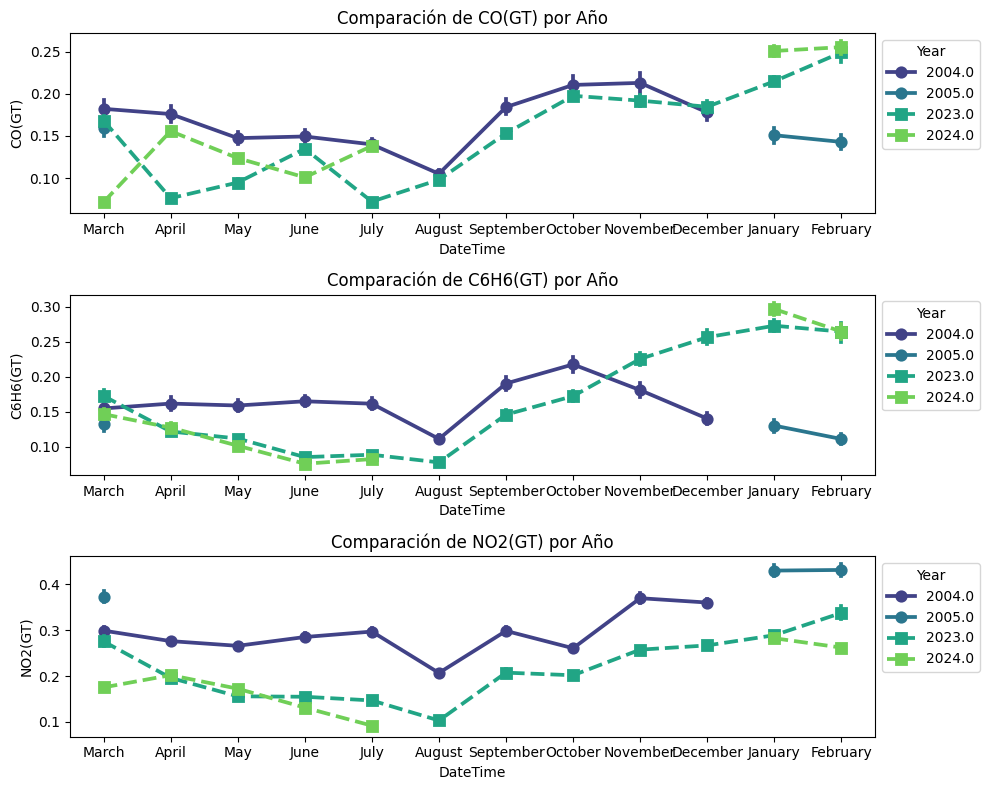

In [ ]:
plt.figure(figsize=(10, 8))

# Lista de gases a mostrar para cada DataFrame
gasList1 = ['CO(GT)', 'C6H6(GT)', 'NO2(GT)']
gasList2 = ['CO_new', 'C6H6_new', 'NO2_new']

# Asumiendo que tienes otra columna para el segundo año llamada 'year2'
YearMonth1 = df_imputado['DateTime'].dt.to_period('M')
YearMonth2 = new_info_scaled['DateTime'].dt.to_period('M')
# Extraer el año y crear una nueva columna
year1 = df_imputado['DateTime'].dt.year
year2 = new_info_scaled['DateTime'].dt.year

# Extraer el mes
Month1 = df_imputado['DateTime'].dt.strftime('%B')
Month2 = new_info_scaled['DateTime'].dt.strftime('%B')

#Definir la paleta 'viridis'
viridis_palette = sns.color_palette('viridis', 256)

# Seleccionar dos colores de la paleta 'viridis'
color1 = viridis_palette[50]
color2 = viridis_palette[100]
color3 = viridis_palette[150]
color4 = viridis_palette[200]

# Graficando los datos
for i, (col1, col2) in enumerate(zip(gasList1, gasList2), start=1):
    plt.subplot(len(gasList1), 1, i)

    # Graficar los datos del primer DataFrame con gasList1
    sns.pointplot(x=Month1, y=col1, hue=year1, data=df_imputado, palette=[color1,color2], linestyles='-', markers='o', ax=plt.gca())

    # Graficar los datos del segundo DataFrame con gasList2
    sns.pointplot(x=Month2, y=col2, hue=year2, data=new_info_scaled, palette=[color3,color4], linestyles='--', markers='s', ax=plt.gca())

    plt.title(f'Comparación de {col1} por Año')
    # Colocar la leyenda en una ubicación diferente
    plt.legend(title='Year', loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()